# Financial Data Anomaly Detection

This project focused on detecting anomalies in unlabled financial data using Gaussian Mixture Models and Isolation Forests from Scikit-Learn. Exploratory data analysis was performed in order to extract features and identify potential anomalies. Given the nature of unlabeled data, there are no ground truth measurements to use in order to verify the performance of each model, so an analysis of different clustering metrics and a comparison to the suspected anomalies from EDA were used to gauge the effectiveness of the anomaly detection models.

# Library Imports

In [1]:
import os
import re

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import percentileofscore
from sklearn.ensemble import IsolationForest
from sklearn.mixture import GaussianMixture

# Custom preprocessing functions
from modules.preprocessing import encode_features, extract_derived_temporal_features

# Custom plotting functions
from modules.plotting import (
    compare_gmm_pca,
    compare_iforest_pca,
    correlation_heatmap,
    custom_boxplot,
    custom_histplot,
    custom_pca_plot,
    plot_aic_bic,
    plot_gmm_metrics,
    plot_iforest_metrics,
    score_histogram,
)

# Custom statistics functions
from modules.statistics import calculate_VIF, compute_kruskal_wallis

# Custom training functions
from modules.training import fit_models

# Custom functions for loading and saving data
from modules.io_utils import load_metric_data, load_object

# Load Data

In [2]:
# Load data
df = pd.read_excel('../data/financial_anomaly_data.xlsx')

# Convert column names to snake_case
df.columns = ['_'.join(re.match(r'([A-Z][a-z]*)([A-Z]?.*)', c).groups()).lower().strip('_') for c in df.columns]
df

,timestamp,transaction_id,account_id,amount,merchant,transaction_type,location
0,2023-01-01 08:00:00,TXN1127,ACC4,95071.92,MerchantH,Purchase,Tokyo
1,2023-01-01 08:01:00,TXN1639,ACC10,15607.89,MerchantH,Purchase,London
2,2023-01-01 08:02:00,TXN872,ACC8,65092.34,MerchantE,Withdrawal,London
3,2023-01-01 08:03:00,TXN1438,ACC6,87.87,MerchantE,Purchase,London
4,2023-01-01 08:04:00,TXN1338,ACC6,716.56,MerchantI,Purchase,Los Angeles
...,...,...,...,...,...,...,...
216955,31-05-2023 23:55,TXN1286,ACC6,62536.88,MerchantA,Withdrawal,San Francisco
216956,31-05-2023 23:56,TXN1015,ACC5,68629.69,MerchantG,Transfer,London
216957,31-05-2023 23:57,TXN1979,ACC15,8203.57,MerchantF,Purchase,London
216958,31-05-2023 23:58,TXN1845,ACC14,77800.36,MerchantF,Purchase,New York


# EDA

## Feature Extraction

Transaction ID is not unique, despite the data descriptions provided to us. This may indicate that Transaction ID represents groups of transactions and not individual transactions or may just be a sign of poor data quality. Regardless, Transaction ID will be dropped since it is supposed to be unique and does not add meaningful variability for anomaly detection.

In [3]:
# Transaction ID is not unique
df.transaction_id.value_counts()

transaction_id
TXN838     139
TXN1768    139
TXN1658    139
TXN1389    138
TXN340     137
          ... 
TXN60       79
TXN891      78
TXN605      78
TXN201      73
TXN799      70
Name: count, Length: 1999, dtype: int64

In [4]:
# Drop Transaction ID column
df = df.drop('transaction_id', axis = 1)

Rename Account ID column for brevity.

In [5]:
# Rename account column for brevity
df = df.rename({'account_id': 'account'}, axis = 1)

All of the entries are from 2023, so we only extract month, day, hour, and minute from the provided timestamps.

In [6]:
# Extract time columns from timestamp (year is not necessary, as all entries are from 2023)
df['timestamp'] = pd.to_datetime(df.timestamp)
df['month'] = df.timestamp.dt.month
df['day'] = df.timestamp.dt.day
df['hour'] = df.timestamp.dt.hour
df['minute'] = df.timestamp.dt.minute
df['weekend'] = (df.timestamp.dt.dayofweek >= 5).astype(int)

To check for anomalous patterns, the following advanced derived temporal features were calculated:

- Time delta (in minutes) between transactions on an account and merchant basis. This tests for frequency in activity. High frequency (low time delta) transactions may be suspicious, as are extremely low frequency transactions.
- Amount delta between consecutive transactions on an account and merchant basis. This tests for the size changes of transactions. Large fluctuations in transaction amount may be cause for concern.
- Hourly transaction count on an account and merchant basis. This tests for transaction velocity. If an account/merchant typically has low transaction velocity and then suddenly has a high transaction velocity, this could indicate anomalous transactions.
- Hourly transaction sum on an account and merchant basis. This tests for amount velocity. Similar to transaction velocity above, if an account/merchant normally moves a certain amount and then suddenly moves large sums of money, this could be anomalous behavior.

In [7]:
# Extract advanced derived temporal features
df = extract_derived_temporal_features(
    df = df,
    categorical_columns = ['account', 'merchant']
)
df

,timestamp,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_count,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_count,merchant_hourly_transaction_sum
0,2023-01-01 08:00:00,ACC4,95071.92,MerchantH,Purchase,Tokyo,1,1,8,0,1,0,0.00,50,2754143.66,0,0.00,90,4629192.07
1,2023-01-01 08:01:00,ACC10,15607.89,MerchantH,Purchase,London,1,1,8,1,1,0,0.00,52,2669240.41,1,-79464.03,90,4629192.07
2,2023-01-01 08:02:00,ACC8,65092.34,MerchantE,Withdrawal,London,1,1,8,2,1,0,0.00,50,2189139.71,0,0.00,67,3641483.96
3,2023-01-01 08:03:00,ACC6,87.87,MerchantE,Purchase,London,1,1,8,3,1,0,0.00,46,2241889.54,1,-65004.47,67,3641483.96
4,2023-01-01 08:04:00,ACC6,716.56,MerchantI,Purchase,Los Angeles,1,1,8,4,1,1,628.69,46,2241889.54,0,0.00,67,3352688.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216955,2023-05-31 23:55:00,ACC6,62536.88,MerchantA,Withdrawal,San Francisco,5,31,23,55,0,5,33338.14,11,513915.65,2,34444.06,28,1549495.36
216956,2023-05-31 23:56:00,ACC5,68629.69,MerchantG,Transfer,London,5,31,23,56,0,19,6250.10,13,728471.84,10,10445.87,15,656636.10
216957,2023-05-31 23:57:00,ACC15,8203.57,MerchantF,Purchase,London,5,31,23,57,0,17,-7262.52,13,560367.12,3,-33876.42,11,359908.49
216958,2023-05-31 23:58:00,ACC14,77800.36,MerchantF,Purchase,New York,5,31,23,58,0,13,-16164.99,14,830904.81,1,69596.79,11,359908.49


In [8]:
# Convert temporal features to category datatypes for ease in future processing
temporal_features = ['month', 'day', 'hour', 'minute', 'weekend']

for col in temporal_features:
    df[col] = df[col].astype('category')

# Drop timestamp as it is no longer necessary
df = df.drop('timestamp', axis = 1)

## Suspected Anomalies due to High Transaction Amounts

Most of the transactions seem to fall within \\$0 - \\$100,000, but there are some outliers which are influencing the graph.

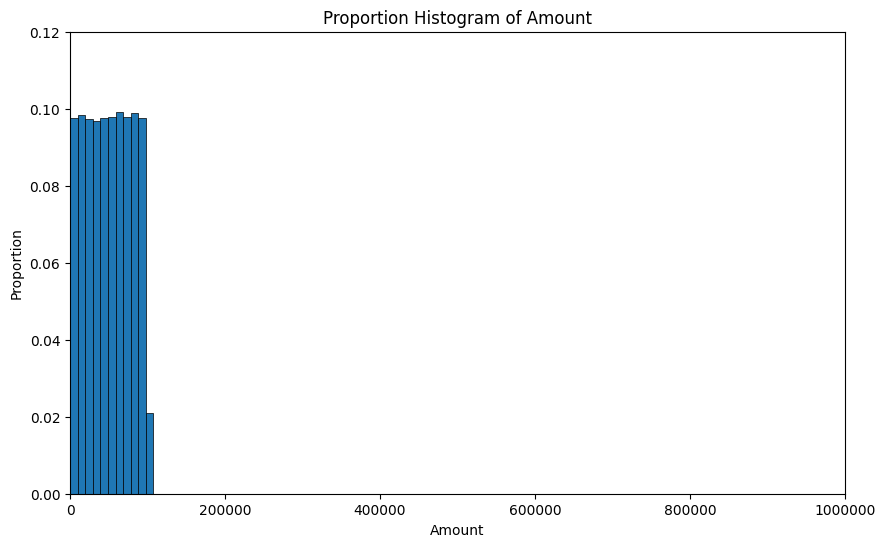

In [9]:
# Proportion histogram of amount
ax = custom_histplot(
    df,
    x = 'amount',
    bins = 100,
    xlim = [0, 1_000_000]
);

# Update tick labels
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([200_000 * i for i in range(0, 6)]);

Investigating transactions greater than \\$99,000 does not initially seem out of place, meaning the number of outliers must be small.

In [10]:
# Transactions with amounts greater than 99,000
df[df.amount > 99_000]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_count,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_count,merchant_hourly_transaction_sum
342,ACC9,99333.76,MerchantI,Purchase,Tokyo,1,1,13,42,1,16,82621.24,52,2651026.57,9,67013.93,73,3856144.09
401,ACC14,99486.68,MerchantH,Transfer,New York,1,1,14,41,1,6,85558.27,55,2326063.92,17,73774.52,73,3246437.54
458,ACC6,99112.73,MerchantG,Purchase,San Francisco,1,1,15,38,1,9,82415.89,41,2280768.75,15,24875.35,85,4394815.27
506,ACC12,99174.34,MerchantG,Transfer,Los Angeles,1,1,16,26,1,5,46626.10,47,2547403.91,12,18812.02,64,3400669.97
589,ACC15,99054.70,MerchantB,Withdrawal,New York,1,1,17,49,1,16,17377.17,49,2393603.90,25,83043.81,69,3588431.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216558,ACC6,99368.33,MerchantH,Purchase,San Francisco,5,31,17,18,0,9,31543.28,14,813212.05,16,48926.28,27,1335908.88
216595,ACC14,99852.06,MerchantF,Purchase,New York,5,31,17,55,0,14,69572.99,10,425018.13,8,95657.64,15,682812.27
216756,ACC4,99119.81,MerchantC,Transfer,New York,5,31,20,36,0,16,49685.93,16,788135.93,10,8270.88,19,877762.12
216837,ACC1,99852.51,MerchantC,Withdrawal,Tokyo,5,31,21,57,0,15,32100.29,14,541236.11,14,49778.72,12,524458.85


99% of the transactions greater than \\$99,000 are less than or equal to \\$99,995.96. It is reasonable to assume that transactions greater than \\$100,000 may be anomalous.

In [11]:
# 99th quantile of amounts for amounts greater than 99,000
df[df.amount > 99_000].amount.quantile(0.99)

99995.964

For transactions greater than \\$100,000, the spread of transaction amounts varies wildly, including some extreme values. Although we do not have labels for anomalies, it is reasonable to suspect these may be anomalous transactions by sheer transaction size. There are 14 transactions with amounts greater than \\$100,000.

In [12]:
# 14 transactions with amounts greater than 100,000
df[df.amount >= 100_000]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_count,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_count,merchant_hourly_transaction_sum
2775,ACC14,978942.26,MerchantJ,Transfer,New York,3,1,6,15,0,10,907115.64,42,2837967.92,6,909751.07,76,4937477.20
3448,ACC12,712076.97,MerchantA,Withdrawal,Tokyo,3,1,17,28,0,4,638092.20,62,3865313.63,24,620655.23,70,4128100.92
3453,ACC8,489492.30,MerchantF,Purchase,Tokyo,3,1,17,33,0,2,453212.26,39,2333584.33,6,392946.14,76,4320645.37
4148,ACC1,187344.37,MerchantD,Purchase,San Francisco,4,1,5,8,1,13,115608.76,43,2156895.48,10,124186.99,47,2406335.30
4194,ACC3,272990.11,MerchantE,Transfer,Los Angeles,4,1,5,54,1,10,229110.78,54,2772019.26,2,247620.63,72,3620173.73
45099,ACC11,151020.55,MerchantB,Transfer,Tokyo,1,2,15,39,0,2,102013.88,56,2970385.35,7,134212.64,66,3240684.88
45100,ACC5,873004.79,MerchantI,Withdrawal,Los Angeles,1,2,15,40,0,19,793864.04,48,3327429.36,5,867004.87,86,5799340.81
45108,ACC8,109150.02,MerchantF,Withdrawal,London,1,2,15,48,0,48,28518.75,32,1799911.22,2,35959.01,65,3290825.52
211714,ACC5,124103.08,MerchantB,Purchase,New York,5,28,8,34,1,23,32044.84,23,1117032.26,3,59376.93,23,1149920.33
211753,ACC4,223542.64,MerchantG,Withdrawal,San Francisco,5,28,9,13,1,2,144431.42,30,1861793.08,8,135246.06,29,1781024.61


In [13]:
# Mark suspected anomalies
df['suspected_anomaly'] = (df.amount > 100_000).astype(int).astype('category')

There appear to be two large clusters in the PCA projection, with a ring of slightly disconnected points around the right cluster and a separate line of points.

The suspected anomalies do not appear very well grouped under PCA projection. 

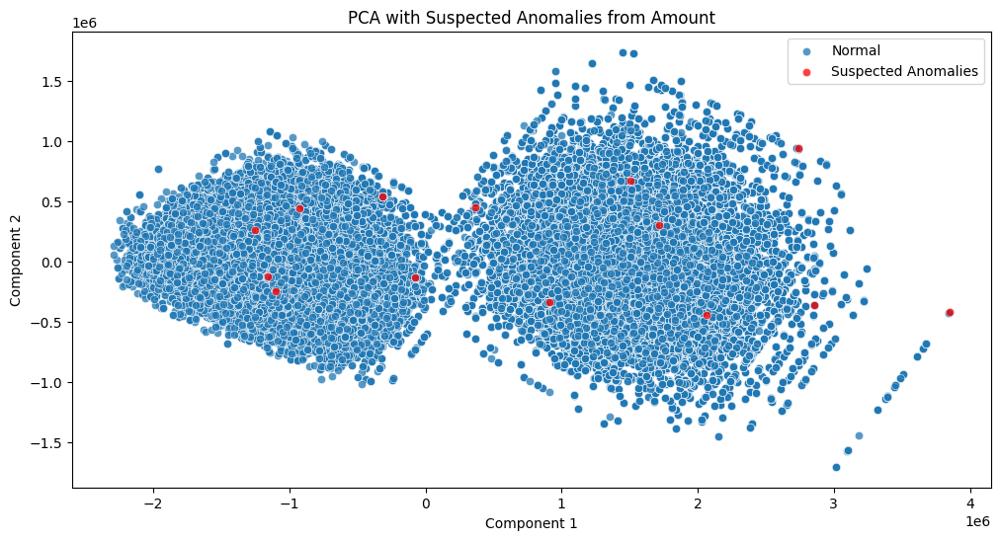

In [14]:
# PCA view of suspected anomalies
custom_pca_plot(
    dataframe = df,
    masks = [df[df.suspected_anomaly == 1].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies from Amount',
    figsize = (12, 6)
);

The distribution of the amounts without suspected anomalies is almost uniform. This is somewhat unusual and may indicate that the dataset is synthetic.

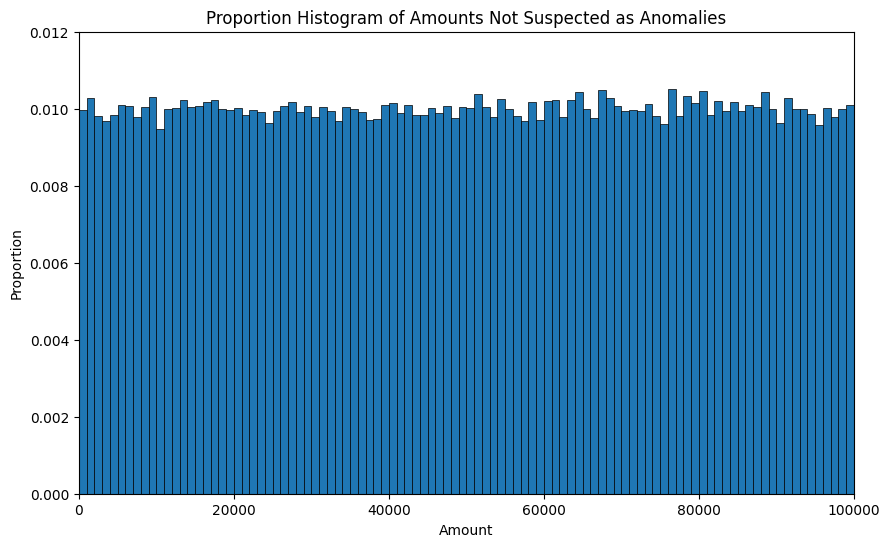

In [15]:
# Proportion histogram of amount without suspected anomalies
ax = custom_histplot(
    df[df.amount <= 100_000],
    x = 'amount',
    bins = 100,
    xlim = [0, 100_000],
    title = 'Proportion Histogram of Amounts Not Suspected as Anomalies'
);

## Check for Missing Values and Data Types

All of the original variables are categorical except for amount. Many of the derived values ae continuous.

There are no null values present in the data and thus we do not need to handle missing values.

In [16]:
# Inspect data types and null counts, no nulls immediately present and all columns are categorical except for amount
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216960 entries, 0 to 216959
Data columns (total 19 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   account                            216960 non-null  object  
 1   amount                             216960 non-null  float64 
 2   merchant                           216960 non-null  object  
 3   transaction_type                   216960 non-null  object  
 4   location                           216960 non-null  object  
 5   month                              216960 non-null  category
 6   day                                216960 non-null  category
 7   hour                               216960 non-null  category
 8   minute                             216960 non-null  category
 9   weekend                            216960 non-null  category
 10  account_time_delta                 216960 non-null  int64   
 11  account_amount_delta      

## Feature Distributions and Interactions

### Numeric Features

#### Correlations

Viewing the correlation heatmap, the most correlated features when combined with amount are the Account/Merchant amount deltas, which makes intuitive sense. Large transactions should be rarer and would cause large deltas.

The time delta features appear to have little correlation with any non-time delta features. Note that this does not mean that these features are of low value, since it would be expected that in most situations, the time between transactions is not dependent upon the size of the transaction; however, fraudulent transactions may break the normal patterns.

The velocity features are highly correlated with one another, indicating high multicollinearity and have little correlation with the amount column. As with the time delta features, low correlation is expected since normal transactions should not exhibit unusual velocities regardless of amount spent.

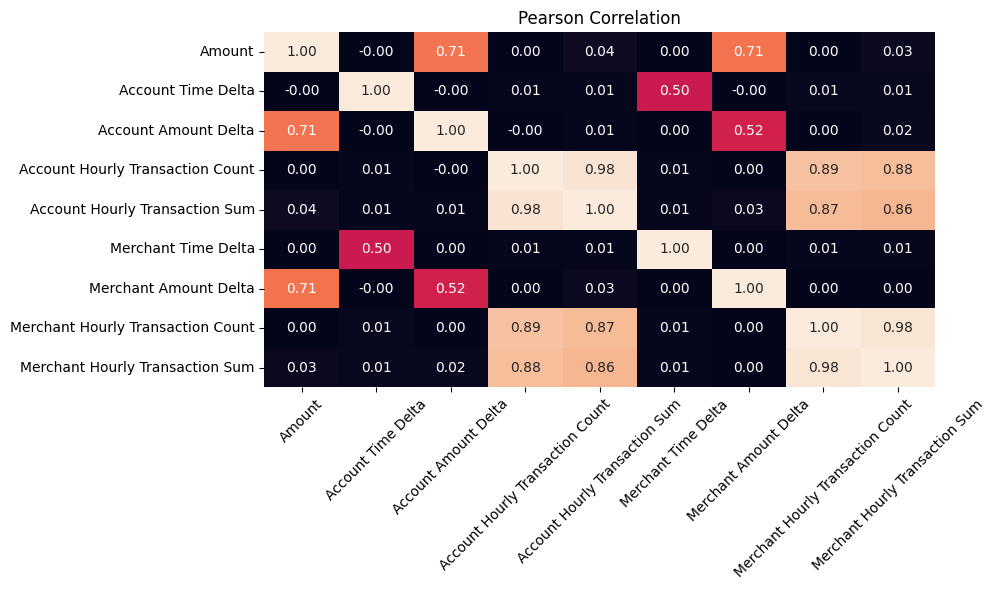

In [17]:
# Pearson correlations for numeric columns
ax = correlation_heatmap(df, abs = False, figsize = (10, 6));

# Save figure
ax.get_figure().savefig('../visualizations/correlation_heatmap.png', dpi = 300, bbox_inches = 'tight')

Gaussian Mixture Models (GMM) are sensitive to collinearity. Isolation Forests are not sensitive to collinearity.

Variance Inflation Factor can be used to calculate collinearity. VIF $\geq$ 10 indicates high multicollinearity. The derived transaction velocity features show high multicollinearity.

In [18]:
# VIF for all numeric features
calculate_VIF(df)

amount                                3.079217
account_time_delta                    1.330811
account_amount_delta                  2.037695
account_hourly_transaction_count     27.401802
account_hourly_transaction_sum       23.289170
merchant_time_delta                   1.330718
merchant_amount_delta                 2.027750
merchant_hourly_transaction_count    35.764434
merchant_hourly_transaction_sum      32.004267
Name: VIF, dtype: float64

The velocity features for each of account/merchant have high multicollinearity. One column from each should be dropped.

In [19]:
# VIF for account velocity features
calculate_VIF(df, columns = ['account_hourly_transaction_count', 'account_hourly_transaction_sum'])

account_hourly_transaction_count    21.989038
account_hourly_transaction_sum      21.989038
Name: VIF, dtype: float64

In [20]:
# VIF for merchant velocity features
calculate_VIF(df, columns = ['merchant_hourly_transaction_count', 'merchant_hourly_transaction_sum'])

merchant_hourly_transaction_count    30.680508
merchant_hourly_transaction_sum      30.680508
Name: VIF, dtype: float64

Removing the velocity counts reduces VIF more than removing the VIF sum counts. Although the velocity counts can pick up many small transactions in a short time period, those transactions are likely not concerning unless they sum to a meaningful amount. For these reasons, the velocity count columns will be dropped.

In [21]:
# VIF without velocity counts
calculate_VIF(
    df,
    columns = [c for c in df.columns if c not in 
               ['account_hourly_transaction_count', 'merchant_hourly_transaction_count']]
)

amount                             2.918110
account_time_delta                 1.330806
account_amount_delta               2.006842
account_hourly_transaction_sum     3.936159
merchant_time_delta                1.330713
merchant_amount_delta              2.001155
merchant_hourly_transaction_sum    3.930819
Name: VIF, dtype: float64

In [22]:
# VIF without velocity sums
calculate_VIF(
    df,
    columns = [c for c in df.columns if c not in 
               ['account_hourly_transaction_sum', 'merchant_hourly_transaction_sum']]
)

amount                               2.912068
account_time_delta                   1.330803
account_amount_delta                 1.999634
account_hourly_transaction_count     4.987718
merchant_time_delta                  1.330716
merchant_amount_delta                1.997966
merchant_hourly_transaction_count    4.987742
Name: VIF, dtype: float64

In [23]:
# Remove high collinearity columns
df = df.drop(['account_hourly_transaction_count', 'merchant_hourly_transaction_count'], axis = 1)

#### Distributions and Suspected Anomalies

The hourly transaction sum by account appears to be bimodal. The number of bins is inflated to try to identify small bin areas that may be outliers. There are not many instances with hourly transaction sums greater than \\$3,500,000. These may be anomalous and require further investigation.

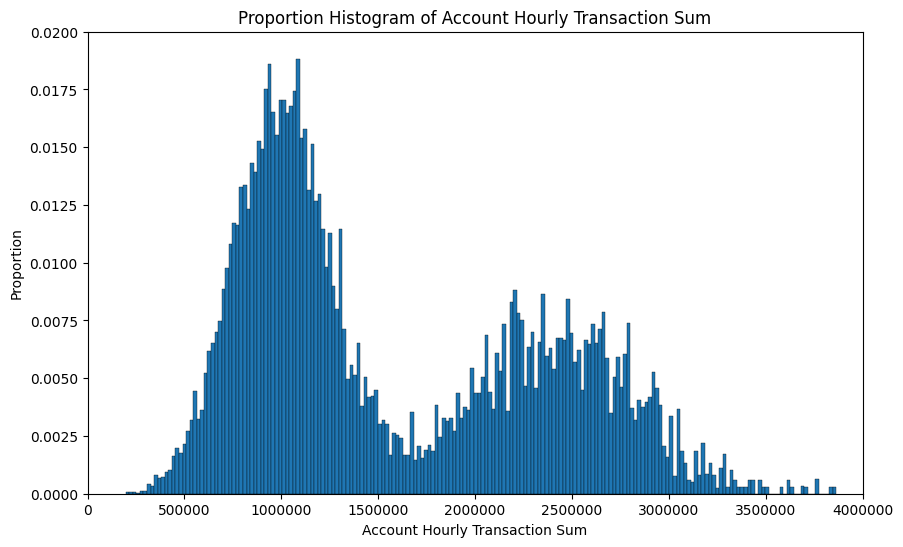

In [24]:
# Histogram of Account Hourly Transaction Sum
ax = custom_histplot(
    df,
    x = 'account_hourly_transaction_sum',
    bins = 200,
    xlim = [0, 4 * 10**6]
)

# Update tick labels
ax.set_xticks(ax.get_xticks());
ax.set_xticklabels([f'{(i / 2) * 10**6:.0f}' for i in range(0, 9)]);

About 99.668% of all transactions have account hourly transaction sum less than \\$3.5 million.

In [25]:
# Percentile of transactions with account hourly transaction sum < 3.5 million
percentileofscore(df.account_hourly_transaction_sum, 3_500_000)

99.66814159292035

In [26]:
# Suspected outliers based on account hourly transaction sum
df[df.account_hourly_transaction_sum > 3_500_000]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
5,ACC15,13957.99,MerchantC,Transfer,London,1,1,8,5,1,0,0.00,3576637.17,0,0.00,3474943.77,0
21,ACC15,71327.35,MerchantA,Purchase,San Francisco,1,1,8,21,1,16,57369.36,3576637.17,0,0.00,3514684.85,0
22,ACC15,25614.27,MerchantI,Transfer,San Francisco,1,1,8,22,1,1,-45713.08,3576637.17,8,-70911.61,3352688.01,0
31,ACC15,16837.42,MerchantH,Purchase,London,1,1,8,31,1,9,-8776.85,3576637.17,12,-14267.70,4629192.07,0
54,ACC15,49256.84,MerchantE,Purchase,Los Angeles,1,1,8,54,1,23,32419.42,3576637.17,10,25064.03,3641483.96,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187162,ACC14,85704.86,MerchantJ,Purchase,Los Angeles,11,5,7,22,1,2,-6122.42,3690075.60,13,-4100.35,3814342.48,0
188580,ACC14,96518.15,MerchantA,Withdrawal,San Francisco,12,5,7,0,0,6,59833.64,3690075.60,5,3436.15,4249359.99,0
188582,ACC14,4001.55,MerchantD,Withdrawal,London,12,5,7,2,0,2,-92516.60,3690075.60,3,-7436.65,2923554.68,0
188630,ACC14,35962.41,MerchantA,Transfer,New York,12,5,7,50,0,48,31960.86,3690075.60,10,-24194.80,4249359.99,0


Viewing these suspected anomalies on the PCA projection, these suspected anomalies all lie along the upper right branch of the floating points of the right "cluster". These seem like strong candidates to add to the suspected anomaly list.

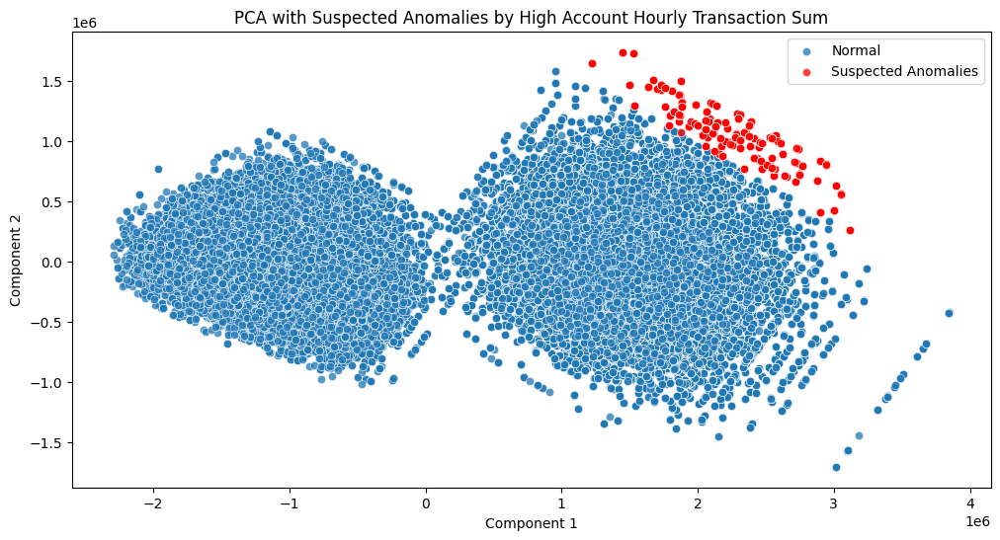

In [27]:
# PCA of Suspected Anomalies by Account Hourly Transaction Sum
custom_pca_plot(
    dataframe = df,
    masks = [df[df.account_hourly_transaction_sum > 3_500_000].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by High Account Hourly Transaction Sum',
    figsize = (12, 6)
);

In [28]:
# Update suspected anomalies
df.loc[df[df.account_hourly_transaction_sum > 3_500_000].index.tolist(), 'suspected_anomaly'] = 1

The hourly transaction sum by merchant also appears to be bimodal. The number of bins is inflated to try to identify small bin areas that may be outliers. There are not many instances with hourly transaction sums greater than about \\$4,800,000. These may be anomalous and require further investigation.

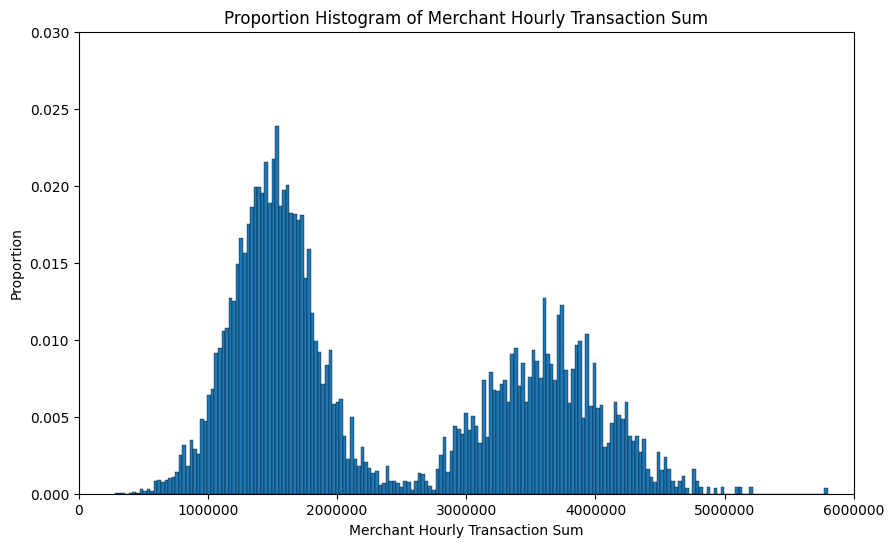

In [29]:
# Histogram of Merchant Hourly Transaction Sum
ax = custom_histplot(
    df,
    x = 'merchant_hourly_transaction_sum',
    bins = 200,
    xlim = [0, 6 * 10**6]
)

# Update tick labels
ax.set_xticks(ax.get_xticks());
ax.set_xticklabels([f'{(i / 2) * 10**6:.0f}' for i in range(0, 14)][::2]);

About 99.669% of all transactions have merchant hourly transaction sum less than \\$4.8 million.

In [30]:
# Percentile of transactions with merchant hourly transaction sum < 4.8 million
percentileofscore(df.merchant_hourly_transaction_sum, 4_800_000)

99.66906342182891

In [31]:
# Suspected outliers based on merchant hourly transaction sum
df[df.merchant_hourly_transaction_sum > 4_800_000]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
440,ACC7,57721.51,MerchantI,Purchase,San Francisco,1,1,15,20,1,29,42789.22,2638607.76,57,3721.20,5217332.60,0
444,ACC9,37532.24,MerchantI,Withdrawal,San Francisco,1,1,15,24,1,11,-16873.98,2529647.10,4,-20189.27,5217332.60,0
449,ACC6,16696.84,MerchantI,Purchase,London,1,1,15,29,1,43,-66058.67,2280768.75,5,-20835.40,5217332.60,0
456,ACC11,76661.19,MerchantI,Withdrawal,Tokyo,1,1,15,36,1,21,44648.41,2291971.69,7,59964.35,5217332.60,0
465,ACC14,61026.41,MerchantI,Transfer,London,1,1,15,45,1,62,50912.84,2030682.61,9,-15634.78,5217332.60,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145656,ACC6,31471.16,MerchantJ,Purchase,Tokyo,12,4,11,36,0,49,15910.61,2177276.48,8,11393.63,5092617.07,0
145667,ACC15,97828.41,MerchantJ,Transfer,New York,12,4,11,47,0,7,26542.34,2311148.30,11,66357.25,5092617.07,0
145668,ACC4,72384.85,MerchantJ,Withdrawal,Los Angeles,12,4,11,48,0,22,-9444.10,3018741.02,1,-25443.56,5092617.07,0
145671,ACC10,96198.82,MerchantJ,Withdrawal,San Francisco,12,4,11,51,0,6,63913.44,2563555.28,3,23813.97,5092617.07,0


Viewing these suspected anomalies on the PCA projection, these suspected anomalies all lie along the lower right branch of the floating points of the right "cluster" and capture all of the "floating" points on the lower right of the graph. These seem like strong candidates to add to the suspected anomaly list.

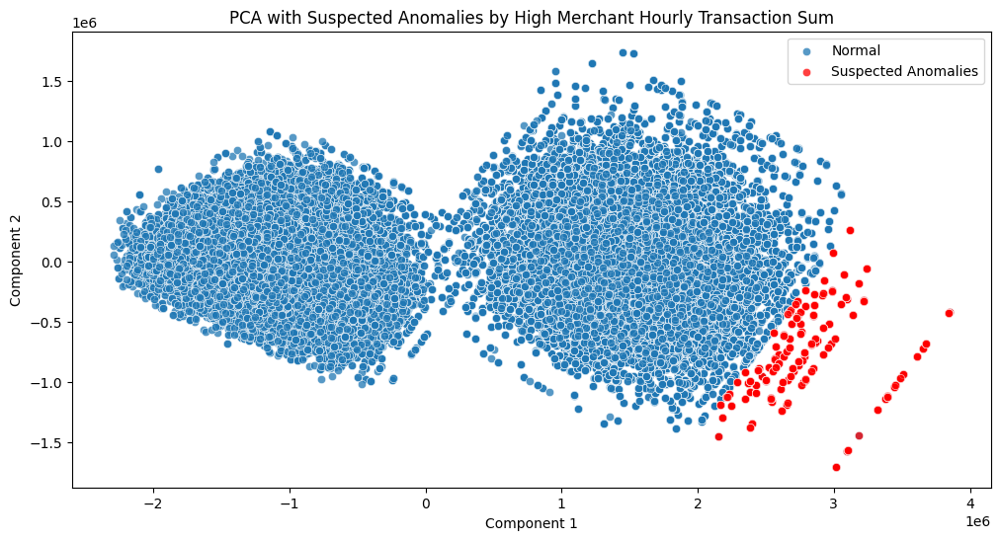

In [32]:
# PCA of Suspected Anomalies by Merchant Hourly Transaction Sum
custom_pca_plot(
    dataframe = df,
    masks = [df[df.merchant_hourly_transaction_sum > 4_800_000].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by High Merchant Hourly Transaction Sum',
    figsize = (12, 6)
);

In [33]:
# Update suspected anomalies
df.loc[df[df.merchant_hourly_transaction_sum > 4_800_000].index.tolist(), 'suspected_anomaly'] = 1

Account time delta appears to be right skewed, with very few instances above 120 minutes (2 hours).

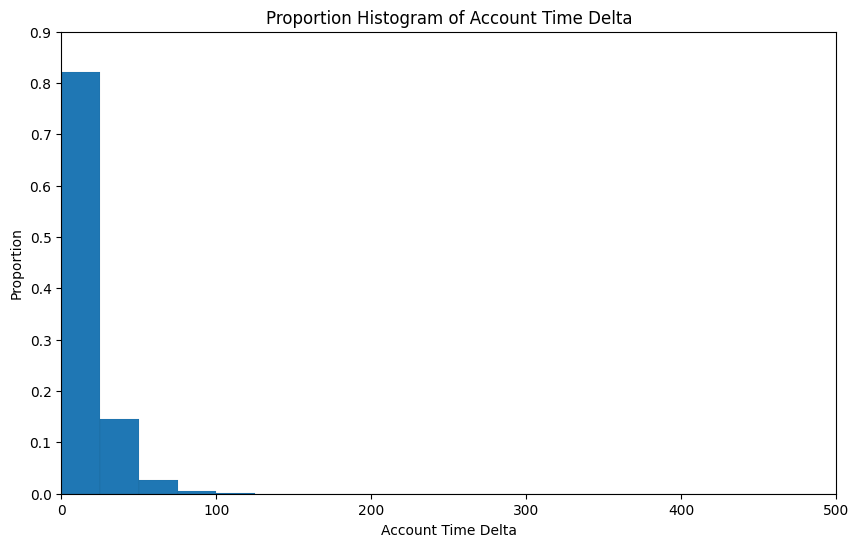

In [34]:
# Histogram of Account Time Delta
ax = custom_histplot(
    df,
    x = 'account_time_delta',
    bins = 1500,
    xlim = [0, 500]
)

About 99.89% of all transactions have account time deltas less than 120 minutes (2 hours).

In [35]:
# Percentile of transactions with account time delta < 120 minutes
percentileofscore(df.account_time_delta, 120)

99.89237647492625

In [36]:
# Suspected outliers based on account time delta
df[df.account_time_delta > 120]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_time_delta,account_amount_delta,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
2763,ACC1,88645.64,MerchantA,Withdrawal,New York,3,1,6,3,0,132,22208.80,2310221.08,3,7733.41,3467889.46,0
3749,ACC12,70176.58,MerchantI,Purchase,Los Angeles,3,1,22,29,0,125,46843.48,2461565.13,3,63185.65,3364936.48,0
7280,ACC1,80334.08,MerchantJ,Transfer,Los Angeles,6,1,9,20,0,134,60814.73,2073359.93,6,-2421.59,4236868.50,0
8160,ACC8,63993.98,MerchantB,Withdrawal,New York,7,1,0,0,1,36003,22228.73,2237780.94,36017,-19692.83,2970518.73,0
8161,ACC15,741.24,MerchantA,Transfer,San Francisco,7,1,0,1,1,36008,-22335.71,2719545.85,36015,-90983.95,3380854.42,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195847,ACC15,48737.99,MerchantC,Transfer,San Francisco,5,17,8,7,0,132,7830.96,889997.27,18,47658.86,1158188.20,0
198452,ACC14,95198.94,MerchantA,Purchase,New York,5,19,3,32,0,125,70856.31,733616.22,8,60392.28,1814189.10,0
203517,ACC10,21980.12,MerchantF,Purchase,Tokyo,5,22,15,57,0,122,-53392.23,668372.90,4,-26403.76,2466502.54,0
208455,ACC3,85426.54,MerchantA,Withdrawal,London,5,26,2,15,0,125,-5525.88,1590271.48,6,42582.72,1513641.57,0


Viewing these suspected anomalies on the PCA projection, these suspected anomalies seem scattered and not clearly anomalous. While this could be due to the 2D projection from PCA, it seems unlikely that these are anomalous data points. The time delta may simply capture too granular of information, since time passed since most recent transaction is unlikely to mean anything without correspondingly high total amounts (captured by hourly sum features). This feature will be dropped.

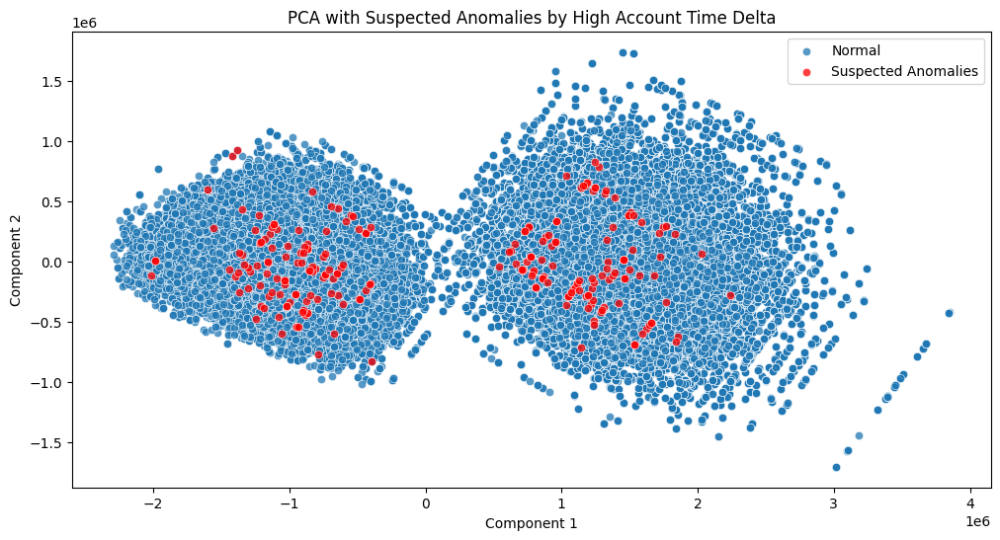

In [37]:
# PCA of Suspected Anomalies by Account Time Delta
custom_pca_plot(
    dataframe = df,
    masks = [df[df.account_time_delta > 120].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by High Account Time Delta',
    figsize = (12, 6)
);

In [38]:
# Drop column since it seems to be of low value
df = df.drop('account_time_delta', axis = 1)

Merchant time delta is also right skewed, with very few instances above 80 minutes (1.33 hours).

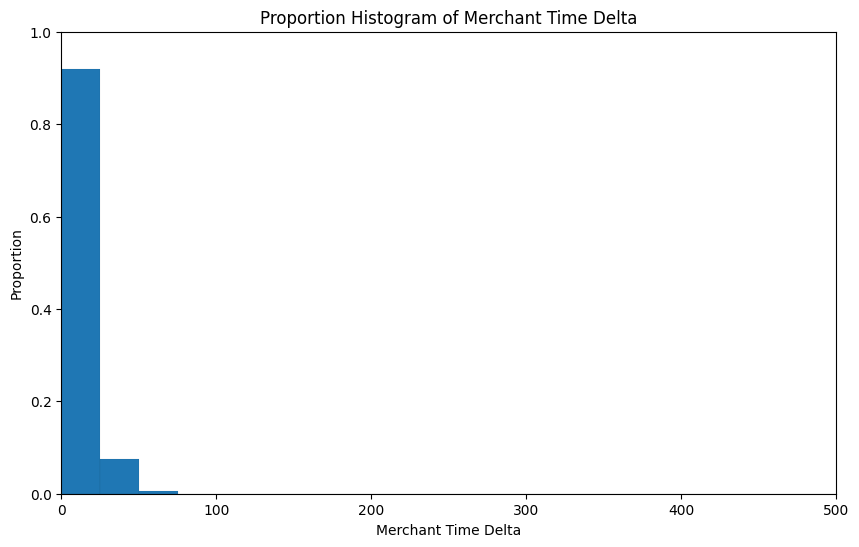

In [39]:
# Histogram of Merchant Time Delta
ax = custom_histplot(
    df,
    x = 'merchant_time_delta',
    bins = 1500,
    xlim = [0, 500]
)

About 99.92% of all transactions have merchant time deltas less than 80 minutes (1.33 hours).

In [40]:
# Percentile of transactions with merchant time delta < 80 minutes
percentileofscore(df.merchant_time_delta, 80)

99.92279682890856

In [41]:
# Suspected outliers based on merchant time delta
df[df.merchant_time_delta > 80]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_amount_delta,account_hourly_transaction_sum,merchant_time_delta,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
5937,ACC15,50252.96,MerchantA,Withdrawal,New York,5,1,10,57,0,-37282.32,3002010.28,93,-45449.63,3796641.67,0
6050,ACC14,94990.00,MerchantI,Transfer,San Francisco,5,1,12,50,0,35565.85,2673156.22,86,45149.83,4055062.58,0
7182,ACC3,63876.05,MerchantG,Withdrawal,New York,6,1,7,42,0,-31478.66,2106042.37,88,14337.47,4243396.26,0
8160,ACC8,63993.98,MerchantB,Withdrawal,New York,7,1,0,0,1,22228.73,2237780.94,36017,-19692.83,2970518.73,0
8161,ACC15,741.24,MerchantA,Transfer,San Francisco,7,1,0,1,1,-22335.71,2719545.85,36015,-90983.95,3380854.42,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203861,ACC7,48762.69,MerchantA,Transfer,Tokyo,5,22,21,41,0,-18128.17,1059782.70,85,-30405.20,1421564.12,0
205558,ACC12,29706.30,MerchantB,Transfer,London,5,24,1,58,0,-62497.27,867323.72,87,-61458.72,2113477.33,0
209224,ACC9,59067.29,MerchantE,Purchase,London,5,26,15,4,0,-37154.18,1126457.73,96,10847.45,1845672.45,0
210671,ACC3,85209.93,MerchantC,Withdrawal,San Francisco,5,27,15,11,1,62854.26,1206768.39,82,21310.33,1140118.73,0


Like the account time delta, these suspected anomalies seem scattered and not clearly anomalous. This feature is probably too granular and will be dropped.

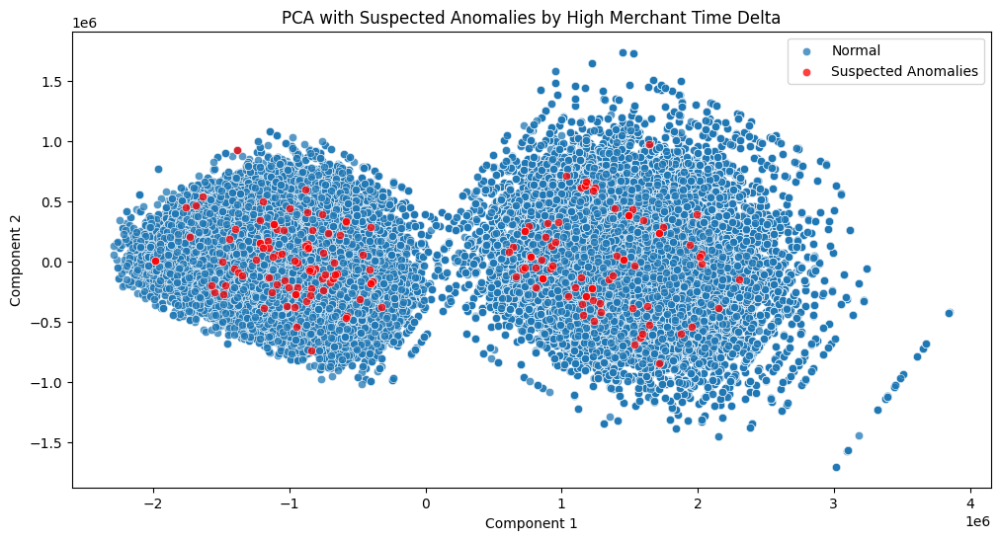

In [42]:
# PCA of Suspected Anomalies by Merchant Time Delta
custom_pca_plot(
    dataframe = df,
    masks = [df[df.merchant_time_delta > 80].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by High Merchant Time Delta',
    figsize = (12, 6)
);

In [43]:
# Drop column since it seems to be of low value
df = df.drop('merchant_time_delta', axis = 1)

Account amount delta appears to be almost perfectly normally distributed. Few values seem to be greater than or less than \\$100,000.

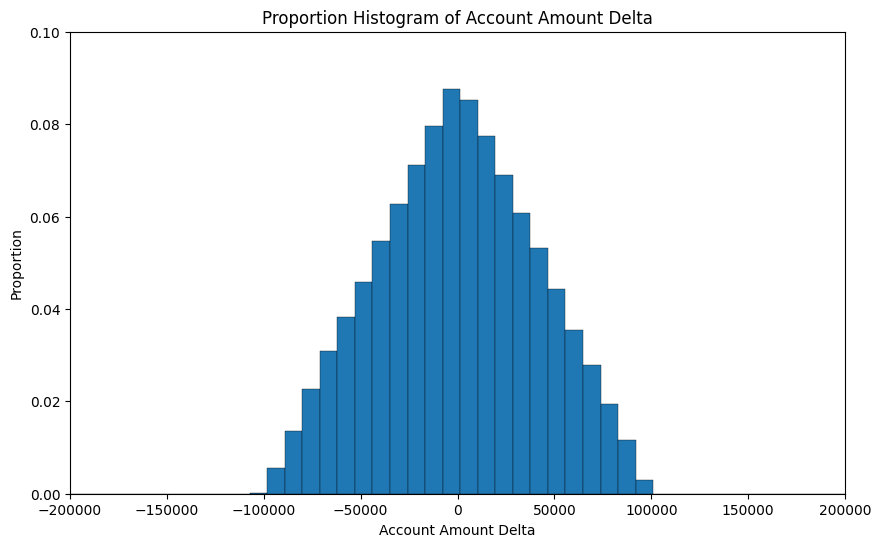

In [44]:
# Histogram of Account Amount Delta
ax = custom_histplot(
    df,
    x = 'account_amount_delta',
    bins = 200,
    xlim = [-0.2 * 10 ** 6, 0.2 * 10 ** 6]
)

About 99.99% of all transactions have account amount deltas between $\pm$ \\$100,000.

In [45]:
# Percentile of transactions with absolute account amount delta greater than 100,000
df[df.account_amount_delta.between(-100_000, 100_000)].shape[0] / df.shape[0]

0.9998893805309734

In [46]:
# Suspected outliers based on account amount delta
df[~df.account_amount_delta.between(-100_000, 100_000)]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_amount_delta,account_hourly_transaction_sum,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
2775,ACC14,978942.26,MerchantJ,Transfer,New York,3,1,6,15,0,907115.64,2837967.92,909751.07,4937477.20,1
2814,ACC14,74547.79,MerchantF,Withdrawal,Los Angeles,3,1,6,54,0,-904394.47,2837967.92,7433.25,3743828.89,0
3448,ACC12,712076.97,MerchantA,Withdrawal,Tokyo,3,1,17,28,0,638092.20,3865313.63,620655.23,4128100.92,1
3453,ACC8,489492.30,MerchantF,Purchase,Tokyo,3,1,17,33,0,453212.26,2333584.33,392946.14,4320645.37,1
3461,ACC8,57551.77,MerchantE,Purchase,San Francisco,3,1,17,41,0,-431940.53,2333584.33,-21111.67,4367836.62,0
3463,ACC12,2223.77,MerchantA,Purchase,San Francisco,3,1,17,43,0,-709853.20,3865313.63,-20201.22,4128100.92,1
4148,ACC1,187344.37,MerchantD,Purchase,San Francisco,4,1,5,8,1,115608.76,2156895.48,124186.99,2406335.30,1
4167,ACC1,46299.10,MerchantE,Withdrawal,Tokyo,4,1,5,27,1,-141045.27,2156895.48,-5124.58,3620173.73,0
4194,ACC3,272990.11,MerchantE,Transfer,Los Angeles,4,1,5,54,1,229110.78,2772019.26,247620.63,3620173.73,1
4210,ACC3,34918.44,MerchantE,Purchase,Tokyo,4,1,6,10,1,-238071.67,1982315.47,-23604.02,3163077.80,0


Most of the found anomalies are scattered and do not appear anomalous, although some of the suspected anomalies lie along branches that were already suspected as anomalies. These will not be added as suspected anomalies, but this feature will be kept since it seems as though it may be useful and has moderately high correlation with amount.

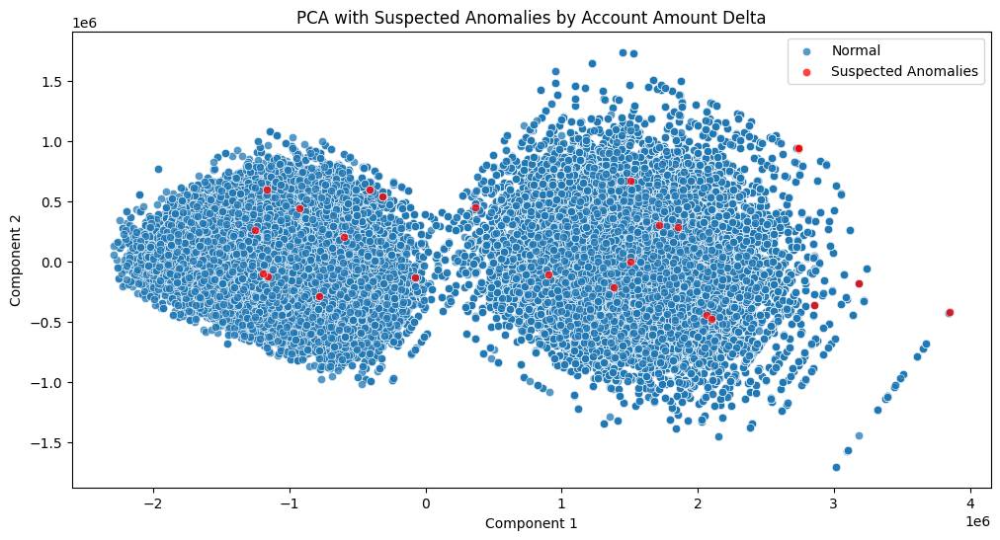

In [47]:
# PCA of Suspected Anomalies by Account Amount Delta
custom_pca_plot(
    dataframe = df,
    masks = [df[~df.account_amount_delta.between(-100_000, 100_000)].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by Account Amount Delta',
    figsize = (12, 6)
);

Merchant amount delta also appears to be almost perfectly normally distributed. Few values seem to be greater than or less than \\$100,000.

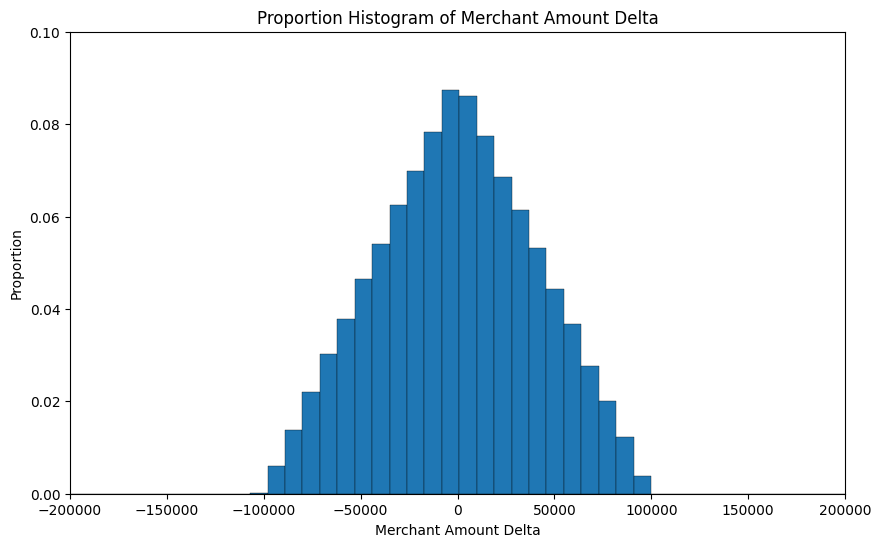

In [48]:
# Histogram of Merchant Amount Delta
ax = custom_histplot(
    df,
    x = 'merchant_amount_delta',
    bins = 200,
    xlim = [-0.2 * 10 ** 6, 0.2 * 10 ** 6]
)

About 99.99% of all transactions have account amount deltas between $\pm$ \\$100,000.

In [49]:
# Percentile of transactions with absolute merchant amount delta greater than 100,000
df[df.merchant_amount_delta.between(-100_000, 100_000)].shape[0] / df.shape[0]

0.9998893805309734

In [50]:
# Suspected outliers based on merchant amount delta
df[~df.merchant_amount_delta.between(-100_000, 100_000)]

,account,amount,merchant,transaction_type,location,month,day,hour,minute,weekend,account_amount_delta,account_hourly_transaction_sum,merchant_amount_delta,merchant_hourly_transaction_sum,suspected_anomaly
2775,ACC14,978942.26,MerchantJ,Transfer,New York,3,1,6,15,0,907115.64,2837967.92,909751.07,4937477.20,1
2779,ACC15,89040.97,MerchantJ,Withdrawal,London,3,1,6,19,0,21971.35,2050144.50,-889901.29,4937477.20,1
3448,ACC12,712076.97,MerchantA,Withdrawal,Tokyo,3,1,17,28,0,638092.20,3865313.63,620655.23,4128100.92,1
3453,ACC8,489492.30,MerchantF,Purchase,Tokyo,3,1,17,33,0,453212.26,2333584.33,392946.14,4320645.37,1
3456,ACC3,22424.99,MerchantA,Transfer,Tokyo,3,1,17,36,0,-16795.08,2703887.31,-689651.98,4128100.92,0
3476,ACC10,45797.34,MerchantF,Purchase,New York,3,1,17,56,0,2055.58,2091710.85,-443694.96,4320645.37,0
4148,ACC1,187344.37,MerchantD,Purchase,San Francisco,4,1,5,8,1,115608.76,2156895.48,124186.99,2406335.30,1
4154,ACC6,80900.45,MerchantD,Withdrawal,New York,4,1,5,14,1,46752.64,2318141.19,-106443.92,2406335.30,0
4194,ACC3,272990.11,MerchantE,Transfer,Los Angeles,4,1,5,54,1,229110.78,2772019.26,247620.63,3620173.73,1
4199,ACC12,95659.19,MerchantE,Withdrawal,San Francisco,4,1,5,59,1,80832.90,2799657.12,-177330.92,3620173.73,0


The Merchant Amount Delta behaves similarly to the Account Amount Delta. These suspected anomalies will not be added, but this feature will be kept.

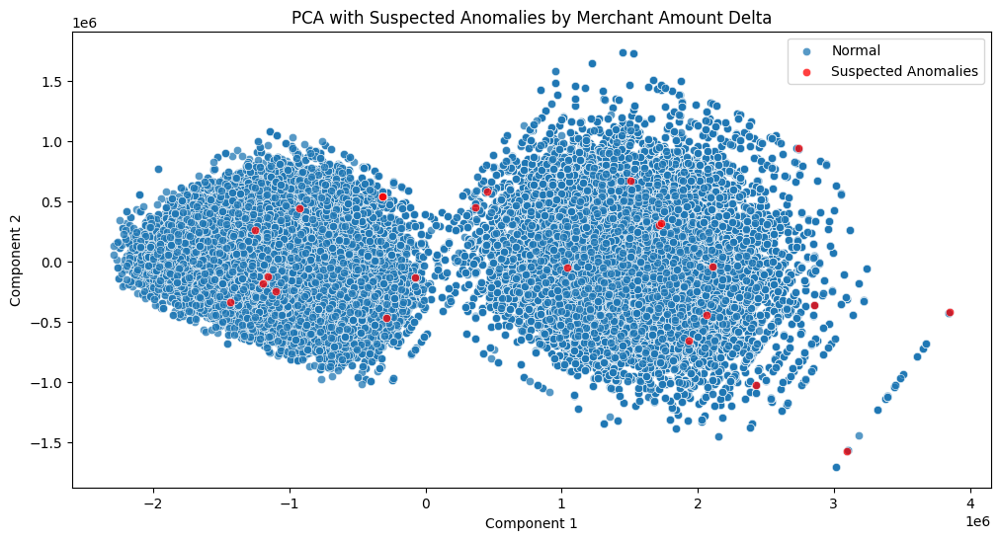

In [51]:
# PCA of Suspected Anomalies by Merchant Amount Delta
custom_pca_plot(
    dataframe = df,
    masks = [df[~df.merchant_amount_delta.between(-100_000, 100_000)].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies by Merchant Amount Delta',
    figsize = (12, 6)
);

Below is the graph of PCA projected data with all suspected anomalies. The suspected anomalies mainly fall on the right side of the graph. There may be other suspected anomalies such as the other slightly distance points on the left side of the right-side cluster, but they were not detected through the EDA of the derived features. The high amount transactions also sometimes exist within clusters and may be hard to extract.

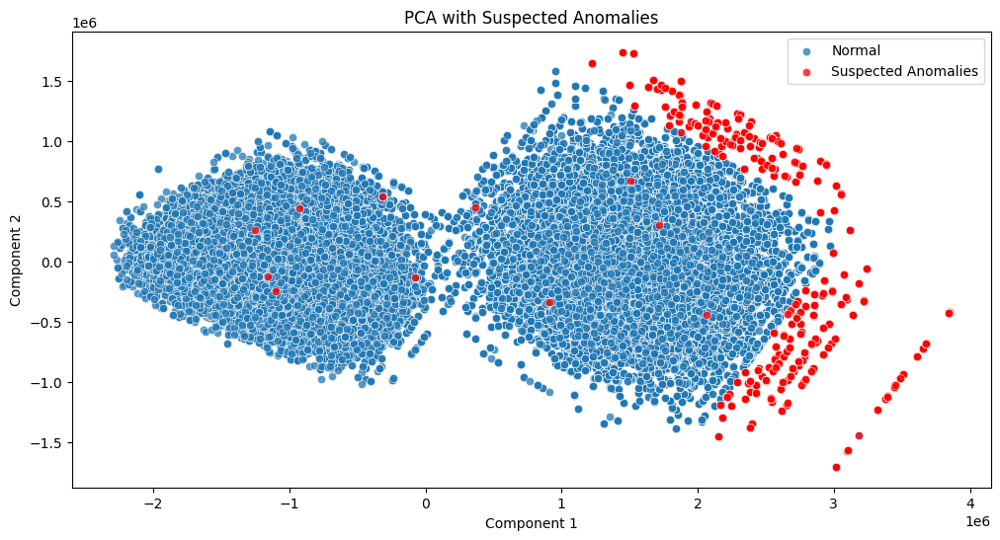

In [55]:
# PCA of All Suspected Anomalies
fig, ax = custom_pca_plot(
    dataframe = df,
    masks = [df[df.suspected_anomaly == 1].index.tolist()],
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    title = 'PCA with Suspected Anomalies',
    figsize = (12, 6)
);

# Save figure
fig.savefig('../visualizations/suspected_anomalies.png', dpi = 300, bbox_inches = 'tight')

### Categorical Variables

Using Kruskal-Wallis to test for difference in group distributions, only two categorical variables are considered significant. One is the generated suspected anomaly feature which will not be used for modeling. The other is the hour variable.

In [53]:
# Kruskal Wallis test for categorical variables with respect to amount
kw = compute_kruskal_wallis(
    dataframe = df,
    continuous_var = 'amount'
)

# Only statistically significant variables
kw[kw.p_value <= 0.05]

,categorical_var,H_statistic,p_value,n_groups,n_total
6,hour,37.327395,3.003588e-02,24,216960
9,suspected_anomaly,48.296300,3.664429e-12,2,216960


9AM, 4PM, and 9PM have a wider spread of transaction amounts, and there is small but noticeable variation in category medians.

For this reason, hour will be kept as a categorical variable.

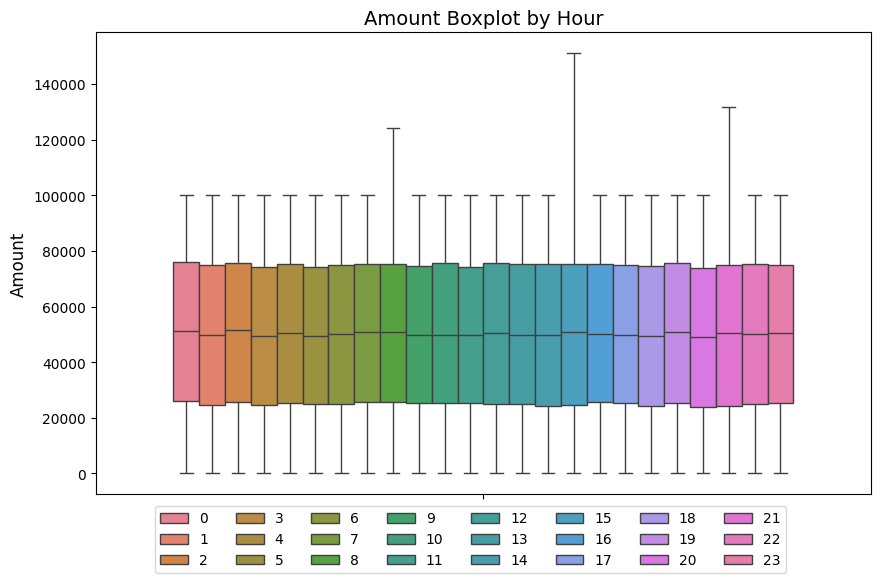

In [18]:
# Boxplot of amount hued by hour
ax = custom_boxplot(
    dataframe = df,
    y = 'amount',
    hue = 'hour'
)

# Move legend
ax.legend(title = '', bbox_to_anchor = (0.9, -0.01), ncols = 8);

# Save figure
ax.get_figure().savefig('../visualizations/boxplot_amount_by_hour.png', dpi = 300, bbox_inches = 'tight')

All other categorical variables are not meaningful by the Kruskal-Wallis test. For example, below is a graph of the boxplot of Amount hued by Location. Each location has nearly identical medians. Even though they have different data spreads, they effectively come from the same underlying distribution and are not meaningfully different.

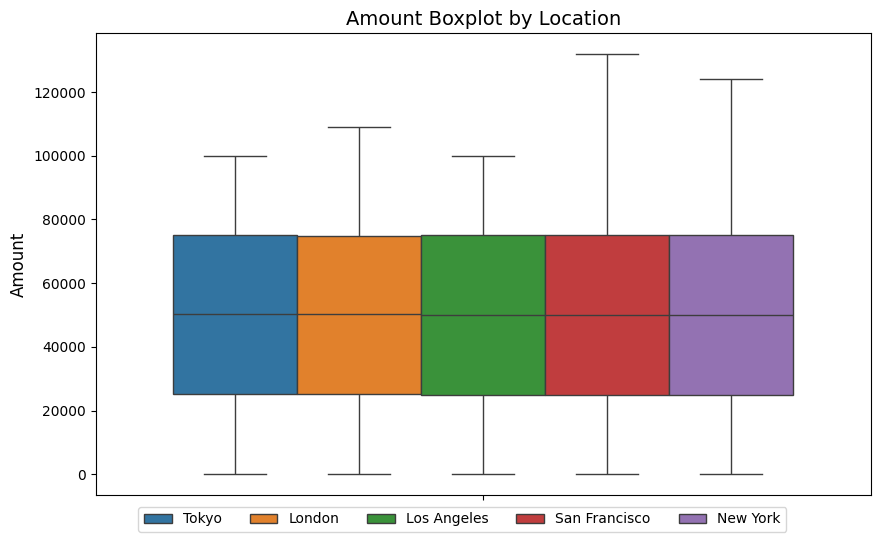

In [55]:
# Boxplot of amount hued by location
ax = custom_boxplot(
    dataframe = df,
    y = 'amount',
    hue = 'location'
)

# Move legend
ax.legend(title = '', bbox_to_anchor = (0.9, -0.01), ncols = 5);

# Data Preparation and Encoding

For data preparation, the following encoding schemes were used.

Numeric Columns were scaled using the Min-Max Scaler. The Min-Max Scaler was used because it preserved data distributions while scaling values to be within 0 and 1. This is important because even though some of the data is skewed, we want to preserve outliers as extreme data points since the goal is to detect anomalies and they should not be obscured.

Categorical columns that were not binary or ordinal with few features were one-hot encoded.

Categorical columns with ordinality were left as is, since they are already ordinally encoded. This covers all of the time-based columns (Month, Day, Hour, Minute) as well as the Weekend binary flag.

The data is split into 80% training and 20% test for evaluation purposes. The suspected anomaly column is used for stratification purposes to ensure that both the training and testing sets have suspected anomalies in them. This is not a supervised training task, but we want to test if our suspected anomalies are classified as anomalies during modeling.

In [56]:
# Split into "X" and "y" just for stratification, since we want each set to have some amount of suspected anomalies
X = df.drop(['suspected_anomaly'], axis = 1)
y = df.suspected_anomaly

# Group columns
numeric_columns = X.select_dtypes('number').columns.tolist()
categorical_columns = X.select_dtypes('object').columns.tolist()
passthrough_columns = X.select_dtypes('category').columns.tolist()

print(f'Numeric Columns: \n{numeric_columns}')
print(f'Categorical Columns: \n{categorical_columns}')
print(f'Passthrough Columns: \n{passthrough_columns}')

Numeric Columns: 
['amount', 'account_amount_delta', 'account_hourly_transaction_sum', 'merchant_amount_delta', 'merchant_hourly_transaction_sum']
Categorical Columns: 
['account', 'merchant', 'transaction_type', 'location']
Passthrough Columns: 
['month', 'day', 'hour', 'minute', 'weekend']


In [57]:
# Encode features
train, test = encode_features(
    X = X,
    y = y,
    numeric_cols = numeric_columns,
    categorical_cols = categorical_columns,
    passthrough_cols = passthrough_columns,
    test_size = 0.2,
    random_state = 42
)

During EDA, we removed some numeric features but did not drop any categorical variables. Most of the categorical variables were considered insignificant by a Kruskal-Wallis test. In order to test whether these categorical variables are useful, two datasets will be created: one with the full feature set and one with a reduced feature set.

Notably, the reduced feature set consists of only 6 features compared to the 43 features in the full feature set due to the lack of one-hot encoded variables.

In [58]:
# Select most promising features from EDA
most_promising_features = train.columns.tolist()[:5] + ['hour', 'suspected_anomaly']

print(f'Reduced Features: \n{most_promising_features}')

Reduced Features: 
['amount', 'account_amount_delta', 'account_hourly_transaction_sum', 'merchant_amount_delta', 'merchant_hourly_transaction_sum', 'hour', 'suspected_anomaly']


In [59]:
# Reduced feature sets
train_reduced = train.loc[:, most_promising_features]
test_reduced = test.loc[:, most_promising_features]

# Save unprocessed datasets for evaluation
df_train = df.loc[train.index, :]
df_test = df.loc[test.index, :]
df_train.to_csv('../data/financial_anomaly_data_unencoded_train.csv', index = False)
df_test.to_csv('../data/financial_anomaly_data_unencoded_test.csv', index = False)

# Save datasets for modeling
train_reduced.to_csv('../data/processed_financial_anomaly_data_reduced_train.csv', index = False)
test_reduced.to_csv('../data/processed_financial_anomaly_data_reduced_test.csv', index = False)
train.to_csv('../data/processed_financial_anomaly_data_full_train.csv', index = False)
test.to_csv('../data/processed_financial_anomaly_data_full_test.csv', index = False)

# Model Training

In [60]:
# Load training sets
train_reduced = pd.read_csv('../data/processed_financial_anomaly_data_reduced_train.csv')
train_full = pd.read_csv('../data/processed_financial_anomaly_data_full_train.csv')

# Load testing sets
test_reduced = pd.read_csv('../data/processed_financial_anomaly_data_reduced_test.csv')
test_full = pd.read_csv('../data/processed_financial_anomaly_data_full_test.csv')

In [61]:
# Define base models
gmm = GaussianMixture(random_state = 42)
iforest = IsolationForest(random_state = 42, n_jobs = -1)

Because there are no labels, this is an unstructured training process. There is no one singular metric to use for scoring these models, so there is no automatic scoring to choose the "best" model hyperparameter combination. Instead, the models will have to be analyzed manually in the analysis section.

For the Gaussian Mixture Model (GMM), ten settings for number of components were tested. The number of components is used to define the number of "clusters" the GMM tries to find. Because this is an anomaly detection test, instead of using the predictions from the GMM (which predicts the component the data point belongs to), the score_samples function will be used instead to obtain the log-likelihood of each test data point under the model configuration. To select the threshold for log-likelihood of anomalous data points, the base contamination rate will be used, which is equal to the proportion of suspected anomaly counts in the training dataset. This proportion will be used as the quantile of GMM log-likelihood scores for anomalous datapoints, with the assumption that low log-likelihood points will be the anomalous points since they are unlikely to occur under the model architecture.

Four different covariance types were also tested for the GMM. Full covariance gives each component its own general covariance matrix, tied covariance makes each component share the same general covariance matrix, diag gives each component its own diagonal covariance matrix, and spherical causes each component to have its own single variance. There are a total of 40 GMM models.

For the Isolation Forest (IForest), four different values for max_samples were tested. Although the IForest typically converges with the default 256 max samples, higher degrees of max samples were tested (in powers of 2 from the base 256) as higher values should reduce the variance of the IForest and make it more accurate. Two different values for max features were tested, using either 50% or 100% of the features for each tree. The default value is to use all of the features, but reducing the number of features can help reduce overfitting.

Four different contamination rates were tested for the IForest, halving the base contamination rate found via EDA. Although the base contamination rate is quite low, we would expect there to be few anomalies in the data and so are using the suspected anomaly rate as the ceiling for total anomalies. There are a total of 40 IForest models.

Each model type was trained on the full feature set and the reduced feature set.

In [62]:
# Gaussian Mixture Model Grid
gmm_grid = {
    'n_components': [i for i in range(2, 21, 2)],
    'covariance_type': ['full', 'tied', 'diag', 'spherical']
}

# Base contamination rate based on suspected anomaly proportion in training set
base_contamination = train_reduced.suspected_anomaly.value_counts().values[1] / train_reduced.shape[0]

# Isolation Forest Grid
iforest_grid = {
    'max_samples': [256 * i for i in range(1, 5)],
    'contamination': [base_contamination * 2 ** i for i in range(-4, 1)],
    'max_features': [0.5, 1.0]
}

In [63]:
# Directories where evaluation metrics, predictions, and trained model files will be saved
results_dir = '../results'
models_dir = '../models'

# Loop over each model type (GMM, Isolation Forest) and each dataset version (full, reduced)
# For every combination:
#   1. Select the appropriate base model (e.g., GaussianMixture or IsolationForest)
#   2. Select its associated parameter grid
#   3. Select the corresponding processed train/test datasets
#   4. Fit all models in the parameter grid using fit_models()
for base_model, model_type, grid in list(zip([gmm, iforest],
                                             ['gmm', 'iforest'],
                                             [gmm_grid, iforest_grid])):
    for dataset_type, train, test in list(zip(['full', 'reduced'],
                                             [train_full, train_reduced],
                                             [test_full, test_reduced])):
        fit_models(
            base_model = base_model,
            model_type = model_type,
            dataset_type = dataset_type,
            grid_dict = grid,
            train_df = train,
            test_df = test,
            results_dir = results_dir,
            models_dir = models_dir
        )

Beginning model fitting over 40 parameter combinations...

[1/40] Fitting model with parameters: {'covariance_type': 'full', 'n_components': 2}
Successfully saved object to ../models/gmm-full-covariance_type_full-n_components_2.pickle
[1/40] Model saved to: ../models/gmm-full-covariance_type_full-n_components_2

[2/40] Fitting model with parameters: {'covariance_type': 'full', 'n_components': 4}
Successfully saved object to ../models/gmm-full-covariance_type_full-n_components_4.pickle
[2/40] Model saved to: ../models/gmm-full-covariance_type_full-n_components_4

[3/40] Fitting model with parameters: {'covariance_type': 'full', 'n_components': 6}
Successfully saved object to ../models/gmm-full-covariance_type_full-n_components_6.pickle
[3/40] Model saved to: ../models/gmm-full-covariance_type_full-n_components_6

[4/40] Fitting model with parameters: {'covariance_type': 'full', 'n_components': 8}
Successfully saved object to ../models/gmm-full-covariance_type_full-n_components_8.pickle


# Analysis of Results

In [57]:
# Set display format for pandas to remove scientific notation
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [58]:
# Results directory
results_dir = '../results'

In [59]:
# Load metric data
gmm_full_metrics = load_metric_data(os.path.join(results_dir, 'gmm-full-metrics.csv'), model_type = 'gmm')
gmm_reduced_metrics = load_metric_data(os.path.join(results_dir, 'gmm-reduced-metrics.csv'), model_type = 'gmm')
iforest_full_metrics = load_metric_data(os.path.join(results_dir, 'iforest-full-metrics.csv'), model_type = 'iforest')
iforest_reduced_metrics = load_metric_data(os.path.join(results_dir, 'iforest-full-metrics.csv'), model_type = 'iforest')

# Load prediction data
gmm_full_predictions = pd.read_csv(os.path.join(results_dir, 'gmm-full-predictions.csv'))
gmm_reduced_predictions = pd.read_csv(os.path.join(results_dir, 'gmm-reduced-predictions.csv'))
iforest_full_predictions = pd.read_csv(os.path.join(results_dir, 'iforest-full-predictions.csv'))
iforest_reduced_predictions = pd.read_csv(os.path.join(results_dir, 'iforest-reduced-predictions.csv'))

# Load unencoded and encoded test data and base contamination rate
base_contamination = 0.006642929572271386
test_full = pd.read_csv(os.path.join('../data/financial_anomaly_data_unencoded_test.csv'))
test_full_enc = pd.read_csv(os.path.join('../data/processed_financial_anomaly_data_full_train.csv'))

## Gaussian Mixture Models

### Full Feature Set

Akaike Information Criterion (AIC) and Bayesion Information Criterion (BIC) are methods for assessing goodness of fit of models. They scores themselves do not have any real meaning, but when comparing different models on the same underlying dataset, the relative scores can be used to choose the models with the best fits. A lower score means a better fit, regardless of sign.

AIC formula:
$$AIC = 2k - 2 \ln(L)$$
where $k$ is the number of parameters and $L$ is the maximum value of the likelihood function for the model.

BIC formula:
$$BIC = k \ln(n) - 2\ln(L)$$
where $n$ is the sample size.

In most situations, the AIC and BIC scores agree on the best model type.

By AIC and BIC, the best GMMs on the full feature set use the full covariance type where each component has its own general covariance matrix. The spherical covariance type where each component has its own single variance performs the worst according to AIC and BIC. The best overall model by AIC and BIC has 18 components and the full covariance type.

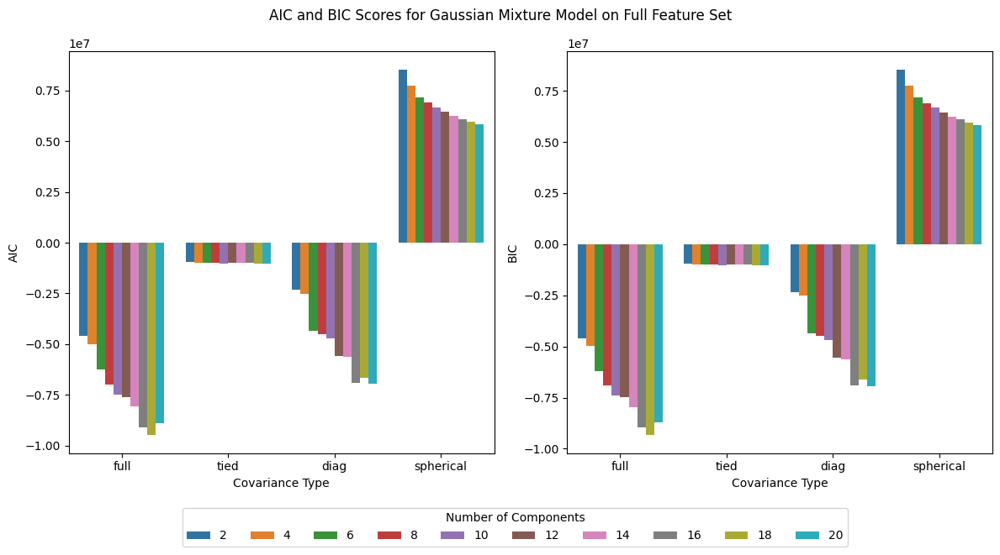

In [60]:
# AIC and BIC for GMM on Full Feature Set
plot_aic_bic(
    dataframe = gmm_full_metrics,
    suptitle = "AIC and BIC Scores for Gaussian Mixture Model on Full Feature Set",
    legend_kwargs = {'ncols': 10, 'bbox_to_anchor': (0.85, 0), 'title': 'Number of Components'}
);

There are three other metrics that can be used for evaluating unstructured model performance. These scores all are used to determine the "goodness" of clusters that are created, which in this project means the goodness of the normal vs. anomaly predictions. Remember that the threshold used for predictions for the GMM models used the base training conamination rate as the quantile of score predictions.

The Silhouette Coefficient measures how well each data point is assigned to its cluster. If the data point is close to other points within the same cluster (the intra-cluster distance) and far from data points within the nearest cluster the sample is not a part of (the inter-cluster distance), then the point is considered well assigned.
$$Silhouette_{score} = \dfrac{b-a}{max(a,b)}$$
where $a$ is the intra-cluster distance and $b$ is the inter-cluster distance. The Silhouette coefficient lies between [-1, 1], where -1 means the sample is allocated to the wrong cluster and 1 means the sample is allocated to the right cluster. A score of 0 means the clusters are overlapping. The Silhouette Coefficient is averaged across all data points to get the Silhouette Score, which lies within the same interval. Scores closer to 1 indicate dense and well separated clusters.

The Calinksi-Harabasz Index, also known as the Variance Ratio Criterion, is defined as the ratio of the average between-cluster dispersion (cluster separation) and of the average within-cluster dispersion (cluster density) for all clusters. Dispersion is calculated as the sum of squared distances. The formula is a bit complex to write here, but the key point is that Calinski-Harabasz Index is nonnegative and unbounded, with higher scores indicating better separation between clusters and higher cluster density.

The Davies-Bouldin Index is a metric for measuring the separation of clusters. The score is nonnegative and unbounded, but unlike the prior two metrics, a value closer to zero is better. The index is the average similarity between each cluster and its most similar one, where the similarity is the ratio of within-cluster distances (effectively cluster density) to between-cluster distances (cluster separation). Values closer to zero indicate better separation of clusters.

- Silhouette Coefficient, CH Index, and DB Index: https://machinelearning-basics.com/the-3-must-know-methods-to-find-the-optimal-k-for-k-means-clustering/
- Silhouette Score Scikit-learn: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html
- Calinski-Harabasz Score Scikit-learn: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabasz_score.html
- Davies-Bouldin Score Scikit-learn: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html

All of the models perform rather poorly by the Silhouette Score, indicating that anomalies are likely difficult to extract from the dataset using full features. However, in an interesting twist, the spherical covariance type performs the best according to these clustering metrics, even though they performed the worst via AIC and BIC. The full covariance type often performed the worst by these clustering metrics despite having the best AIC and BIC.

AIC and BIC only state whether the data fits the model type well. In other words, whether the covariance type and number of components fits the data well. It has no concept of the clusters created for anomaly detection, and so this is a strong indicator that the AIC and BIC are being overly influenced by the number of normal points within the data. Because the normal points make up such a large portion of the data, it is possible that they fit the models very well but perform anomaly detection poorly.

The best models by these clustering scores are the models with spherical covariance type. Surprisingly, the models with the tied covariance type (all components share the same general covariance matrix) perform worse by Silhouette score but second best by Calinkski-Harabasz and Davies-Bouldin indexes. This is because the average Silhouette score is likely influenced by the low presence of anomaly data points due to the clusters having significantly different amounts of points assigned to them. The absolute best model by clustering metrics is thus the model using 20 components and spherical covariance type.

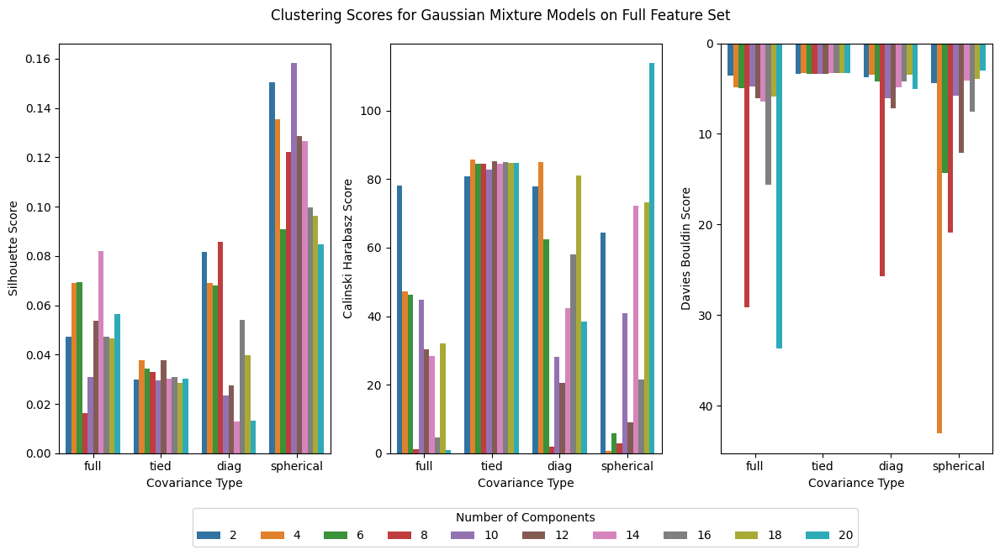

In [61]:
# Clustering metrics for GMM on Full Feature Set
plot_gmm_metrics(
    dataframe = gmm_full_metrics,
    suptitle = 'Clustering Scores for Gaussian Mixture Models on Full Feature Set',
    legend_kwargs = {'ncols': 10, 'bbox_to_anchor': (0.86, 0), 'title': 'Number of Components'}
);

The top models by clustering metrics for each of the covariance types, as well as the best model by AIC and BIC will be compared.

In [62]:
# Candidate comparisons for GMM on full feature set
comparison_rows = [
    {
        'n_components': 20,
        'covariance_type': 'spherical' # Best spherical by clustering metrics
    },
    {
        'n_components': 4,
        'covariance_type': 'diag' # Best diagonal by clustering metrics
    },
    {
        'n_components': 4,
        'covariance_type': 'tied' # Best tied by clustering metrics
    },
    {
        'n_components': 2,
        'covariance_type': 'full' # Best full by clustering metrics
    },
    {
        'n_components': 18,
        'covariance_type': 'full' # Best full by AIC and BIC
    }
]

Despite having the best scores by clustering metrics, the predictions using 20 components and the spherical covariance type (plot 1) do not show very meaningful patterns for anomalies. While it has already been observed that the data is not well separated, the anomalies that were detected do not seem visually plausible, even when taking into account that visual intuition may be wrong given the PCA projected nature of the data.

Similarly, the model with 18 components and full covariance type, which has the best AIC and BIC scores, also produces poor predictions. It does pick up more straggling outliers on the "island" and right cluster compared to the 20 component, spherical model. Both of these models have a high number of components, suggesting that this high number of components is actually a drawback and not well-suited to modeling this data, which makes sense as visually by PCA there are 2-3 "clusters".

The best 3 models for diagonal, tied, and full covariance types by clustering metrics (with 4, 4, and 2 components, respectively) seem to produce much more realistic predictions. In particular, the GMM model with 4 components and the tied covariance type seems to capture the entirety of the "island" and most of the stragglers surrounding the right cluster, which matches the visual intuition for anomalies in this dataset that were not even able to be captured during EDA with the suspected anomalies. It is possible that this model could perform even better by increasing the threshold slightly above the base contamination rate that was used in creating these predictions.

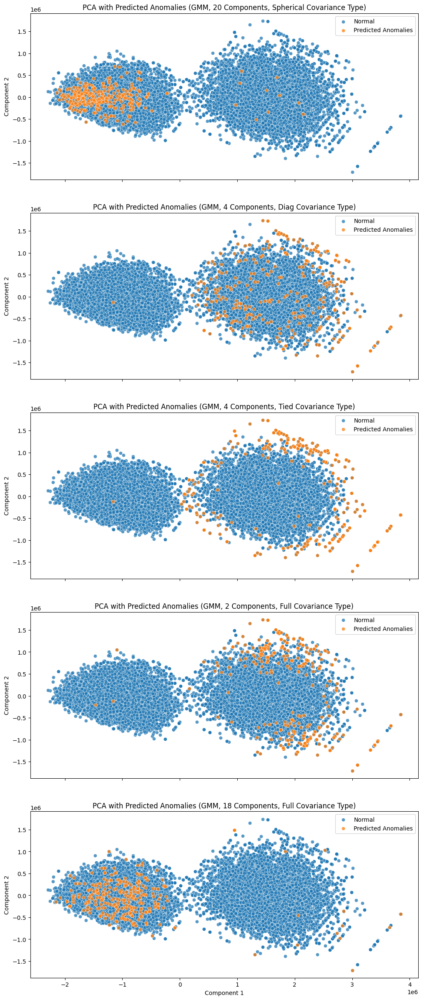

In [63]:
# Compare the predictions of the candidate GMM models on the full feature set
fig, ax = compare_gmm_pca(
    comparison_rows = comparison_rows,
    predictions_df = gmm_full_predictions,
    test_df = test_full
);

The best model with 4 components and tied covariance has a smooth score distribution, with only one peak and is left skewed. The tied covariance type causes each component to use the same covariance matrix, which prevents the clusters from separating in terms of score distribution. This makes it easier to identify anomalies since they likely exist on the left-side tail of the shared distribution.

The spherical model with 20 components (the "best" by clustering metrics) has extreme stochasticity in its distribution. The stochastic nature arises from the spherical covariance type, while the large number of peaks arises from the high number of components. This model may struggle to detect potential anomalies, since even though there are points with low scores, the distribution is not smooth.

The full model with 18 components (the "best" by AIC/BIC) has a somewhat smooth score distribution. The high number of components leads to a large number of peaks, since each component is given a unique covariance matrix. This can make it hard to identify potential anomalies, since anomalies might exist in infrequent parts of the distributions that are not on the global left-side tail (for example, in-between the first and second peaks).

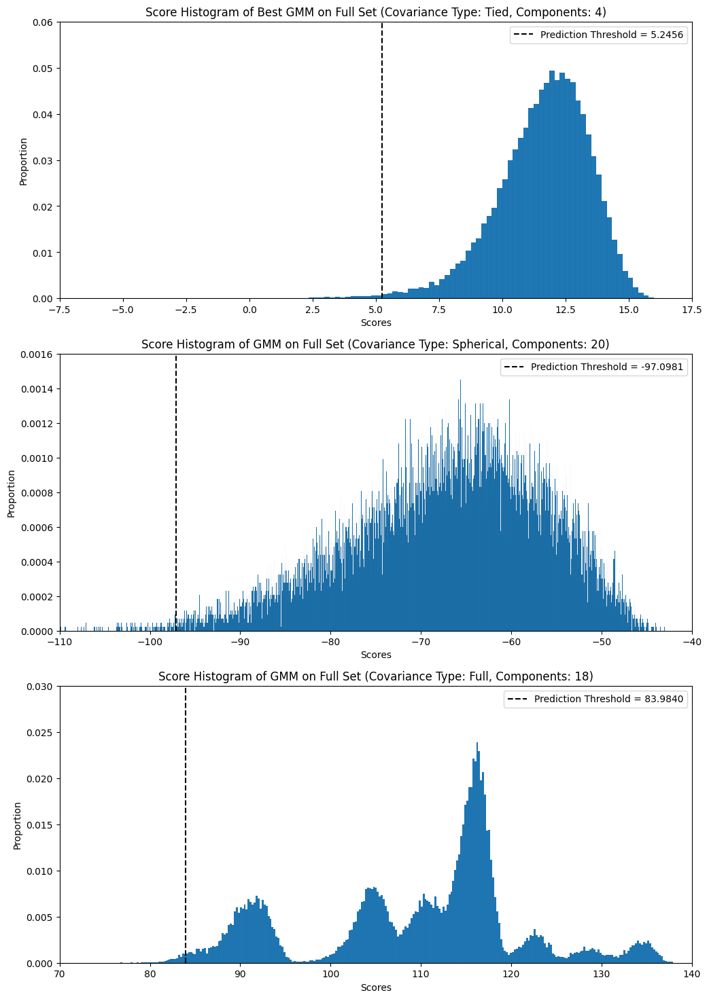

In [9]:
# Score histograms for GMMs on Full Feature Set
fig, ax = plt.subplots(3, 1, figsize = (12, 18))

score_histogram(
    dataframe = gmm_full_predictions,
    score_col = 'covariance_type_tied-n_components_4-scores',
    contamination = base_contamination,
    bins = 2500,
    title = 'Score Histogram of Best GMM on Full Set (Covariance Type: Tied, Components: 4)',
    ax = ax[0]
);

score_histogram(
    dataframe = gmm_full_predictions,
    score_col = 'covariance_type_spherical-n_components_20-scores',
    contamination = base_contamination,
    bins = 2500,
    title = 'Score Histogram of GMM on Full Set (Covariance Type: Spherical, Components: 20)',
    ax = ax[1]
);

score_histogram(
    dataframe = gmm_full_predictions,
    score_col = 'covariance_type_full-n_components_18-scores',
    contamination = base_contamination,
    bins = 2500,
    title = 'Score Histogram of GMM on Full Set (Covariance Type: Full, Components: 18)',
    ax = ax[2]
);

### Reduced Feature Set

Unlike the full feature set, the AIC and BIC scores monotonically decrease for all covariance types as the number of components increases. The full and diagonal covariance types with 20 components are the best by AIC and BIC, with the spherical covariance type having the worst AIC and BIC.

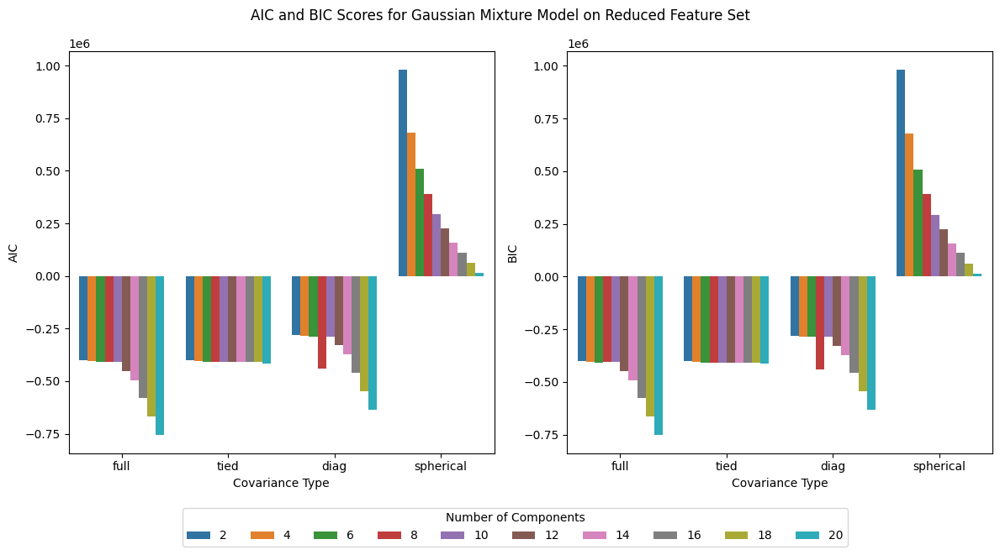

In [10]:
# AIC and BIC for GMM on Reduced Feature Set
plot_aic_bic(
    dataframe = gmm_reduced_metrics,
    suptitle = "AIC and BIC Scores for Gaussian Mixture Model on Reduced Feature Set",
    legend_kwargs = {'ncols': 10, 'bbox_to_anchor': (0.85, 0), 'title': 'Number of Components'}
);

Unlike the full feature set, the high component models have negative average Silhouette score, indicating reversed cluster assignment on average. There are still some disagreements between the Silhouette score and the Calinski Harabasz and Davies Bouldin indexes. The reason for this is not clear, although it may be due to the low presence of anomaly data points. Tor the purposes of candidates, the Silhouette score will be ignored again.

Based on the clustering metrics, the best candidate models are:
- Full with 20 components
- Tied with 20 components
- Diagonal with 20 components
- Spherical with 8 components

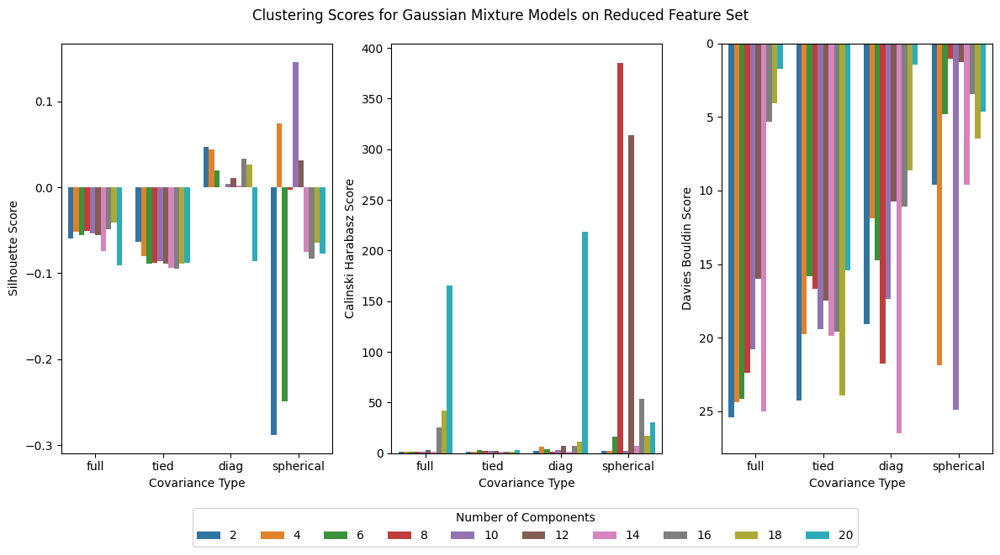

In [11]:
# Clustering metrics for GMM on Reduced Feature Set
plot_gmm_metrics(
    dataframe = gmm_reduced_metrics,
    suptitle = 'Clustering Scores for Gaussian Mixture Models on Reduced Feature Set',
    legend_kwargs = {'ncols': 10, 'bbox_to_anchor': (0.86, 0), 'title': 'Number of Components'}
);

The top models by clustering metrics for each of the covariance types. Since AIC/BIC and the clustering metrics  disagree on the best spherical model, the best spherical model by AIC/BIC will also be tested.

In [12]:
# Candidate comparisons for GMM on reduced feature set
comparison_rows = [
    {
        'n_components': 8,
        'covariance_type': 'spherical' # Best spherical by clustering metrics
    },
    {
        'n_components': 20,
        'covariance_type': 'diag' # Best diagonal by clustering metrics
    },
    {
        'n_components': 20,
        'covariance_type': 'tied' # Best tied by clustering metrics
    },
    {
        'n_components': 20,
        'covariance_type': 'full' # Best full by clustering metrics and by AIC and BIC
    },
    {
        'n_components': 20,
        'covariance_type': 'spherical' # Best spherical by AIC and BIC
    }
]

All of these models perform much worse on the reduced feature set compared to the full feature set. The model with 20 components using the tied covariance type performs reasonably well, as does the model with 20 components using the spherical covariance type. However, they are only able to capture outliers mainly on the upper right of the rightmost cluster, unlike the models on the full dataset.

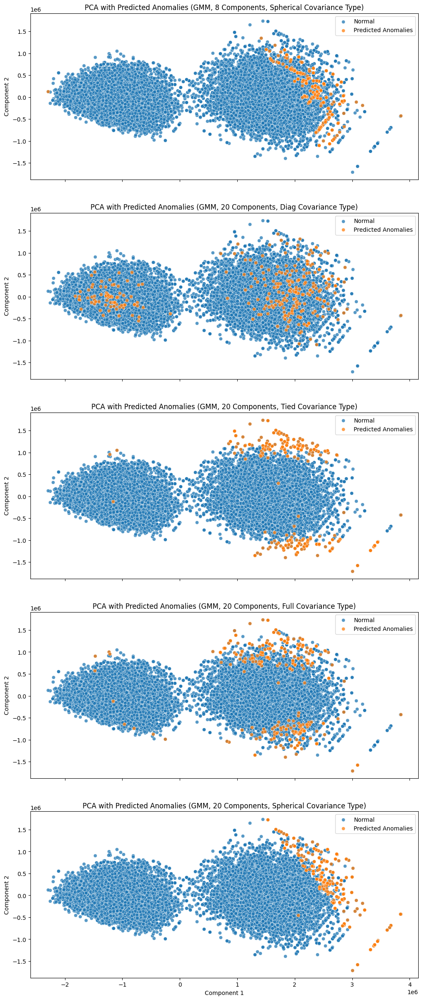

In [13]:
# Compare the predictions of the candidate GMM models on the full feature set
compare_gmm_pca(
    comparison_rows = comparison_rows,
    predictions_df = gmm_reduced_predictions,
    test_df = test_full
);

The model using tied covariance type with 20 components has a smooth distribution which makes finding outlier values relatively simple, similar to the GMMs with tied covariance type on the full feature set.

The model with spherical covariance and 20 components has two recognizable distributions and is highly stochastic. It seems likely that more anomalies could be found by increasing the threshold a bit more as there is still a portion of the distribution with low frequency points. However, this model still seems to perform worse than the GMMs on the full feature set.

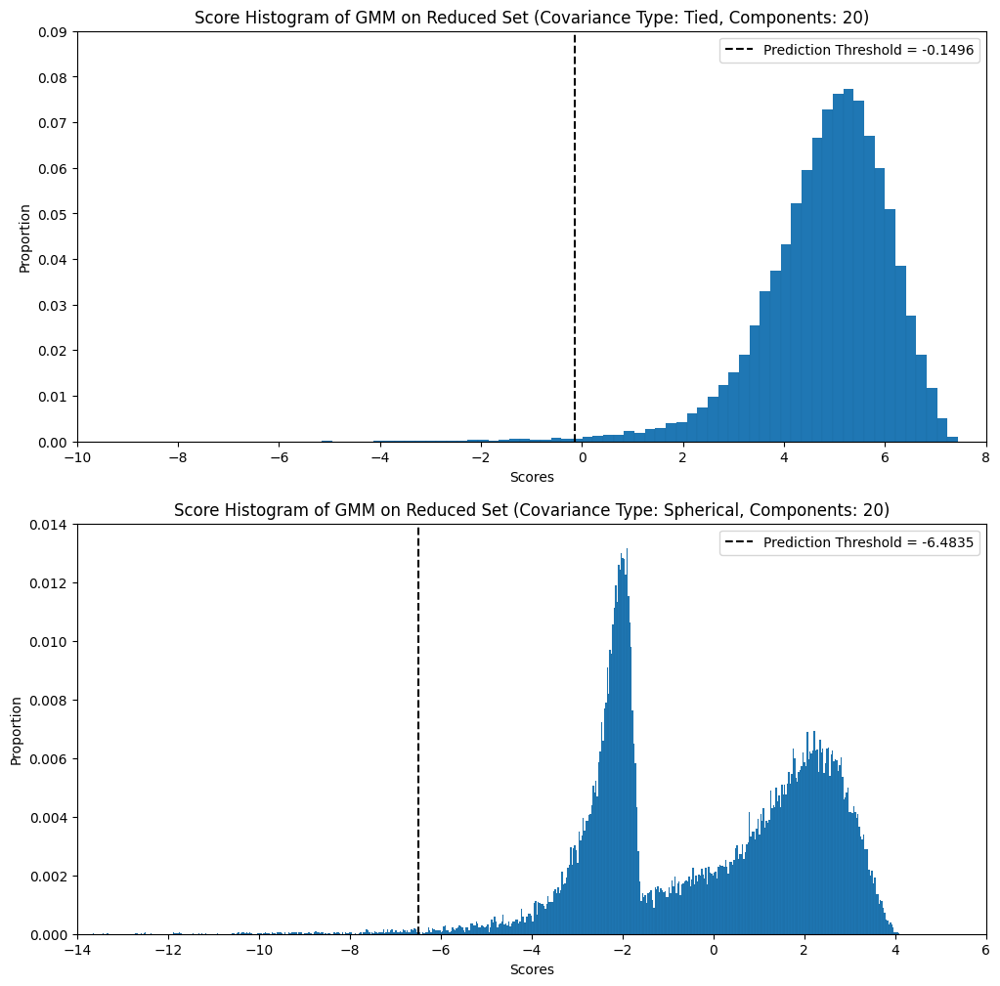

In [14]:
# Score histograms for GMMs on Reduced Feature Set
fig, ax = plt.subplots(2, 1, figsize = (12, 12))

score_histogram(
    dataframe = gmm_reduced_predictions,
    score_col = 'covariance_type_tied-n_components_20-scores',
    contamination = base_contamination,
    bins = 2500,
    title = 'Score Histogram of GMM on Reduced Set (Covariance Type: Tied, Components: 20)',
    ax = ax[0]
);

score_histogram(
    dataframe = gmm_reduced_predictions,
    score_col = 'covariance_type_spherical-n_components_20-scores',
    contamination = base_contamination,
    bins = 2500,
    title = 'Score Histogram of GMM on Reduced Set (Covariance Type: Spherical, Components: 20)',
    ax = ax[1]
);

## Isolation Forest Models

### Full Feature Set

As with the GMM models, the Silhouette scores are generally quite low. This is likely due to low presence of anomalies within the data, making the "cluster" for the normal data relatively spread out and bringing down the average Silhouette score.

Interestingly, the Calinski-Harabasz score increases as the contamination rate increases up to the base contamination rate. This indicates a better ratio of between-cluster dispersion to within-cluster dispersion. However, the Davies-Bouldin score also seems to increase as the contamination rate increases, which indicates a wrose ratio of within-cluster distances to between-cluster distances. This is a bit paradoxical and the reason for this phenomenon is not immediately apparent based solely on these metric scores.

The candidate models whose predictions will be inspected more closely are:
- 0.0625x Base Contamination, Max Samples 512, Max Features 1.0
- 0.125x Base Contamination, Max Samples 512, Max Features 1.0
- 0.25x Base Contamination, Max Samples 256, Max Features 1.0
- 0.5x Base Contamination, Max Samples 256, Max Features 1.0,
- 1x Base Contamination, Max Samples 256, Max Features 1.0 (notably, the Default Isolation Forest parameters)

Increasing the number of samples seems to have had little effect (except for possible overfitting) and reducing the number of features was generally a net negative.

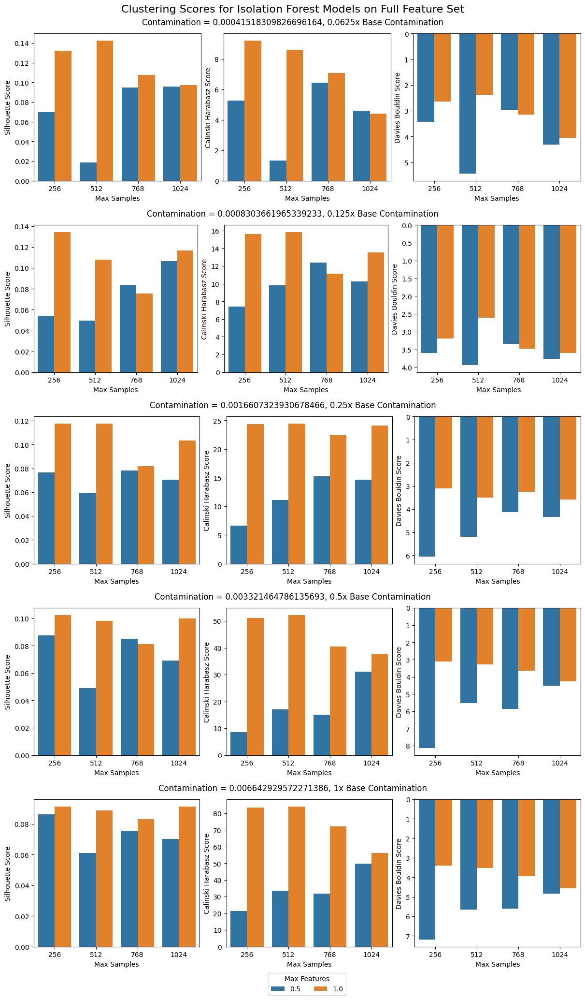

In [15]:
# Clustering Scores for Isolation Forest on Full Feature Set
plot_iforest_metrics(
    dataframe = iforest_full_metrics,
    suptitle = 'Clustering Scores for Isolation Forest Models on Full Feature Set'
);

In [16]:
# Candidate comparisons for Isolation Forest on full feature set
comparison_rows = [
    {
        'contamination_rate': 0.0625 * base_contamination, # Best model for 0.0625x base contamination
        'max_samples': 512,
        'max_features': 1 
    },
    {
        'contamination_rate': 0.125 * base_contamination, # Best model for 0.125x base contamination
        'max_samples': 512,
        'max_features': 1.0
    },
    {
        'contamination_rate': 0.25 * base_contamination, # Best model for 0.25x base contamination
        'max_samples': 256,
        'max_features': 1.0
    },
    {
        'contamination_rate': 0.5 * base_contamination, # Best model for 0.5x base contamination
        'max_samples': 256,
        'max_features': 1.0
    },
    {
        'contamination_rate': 1 * base_contamination, # Best model for 1x base contamination
        'max_samples': 256,
        'max_features': 1 
    }
]

The lower contamination rate models predict fewer anomalies, as expected, since the number of anomalies predicted is directly baked in to the contamination rate of the Isolation Forest. However, all of the Isolation Forests appear to struggle to predict points that seem like visual anomalies under PCA projection. Since there are no labels to compare against, perhaps these models are extracting subtle anomalies that are not immediately apparent, but these predicted anomalies do not appear to be visually obvious.

Unlike the GMM models, the predicted anomalies do not appear well clustered.

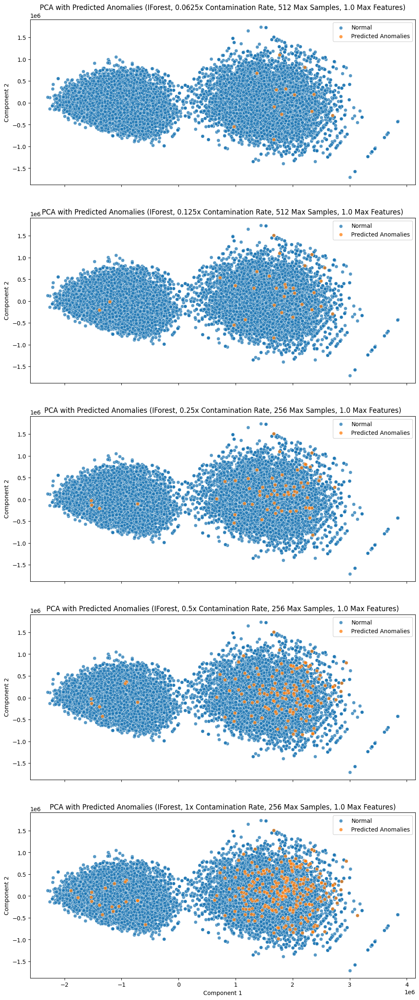

In [17]:
# Compare the predictions of the candidate Isolation Forest models on the full feature set
compare_iforest_pca(
    comparison_rows = comparison_rows,
    predictions_df = iforest_full_predictions,
    base_contamination = base_contamination,
    test_df = test_full
);

Similarly to the spherical covariance GMM models, the Isolation Forest model score distributions are not smooth. Interestingly, the Isolation Forest model distributions appear roughly normal. Unlike the GMM models, the Isolation Forest models do not use log-likelihood for scoring. Isolation Forests classify outliers as having negative scores and inliers as having positive scores; however, based on the visual inspection earlier, it seems likely that the Isolation Forest is struggling to properly classify inliers and outliers.

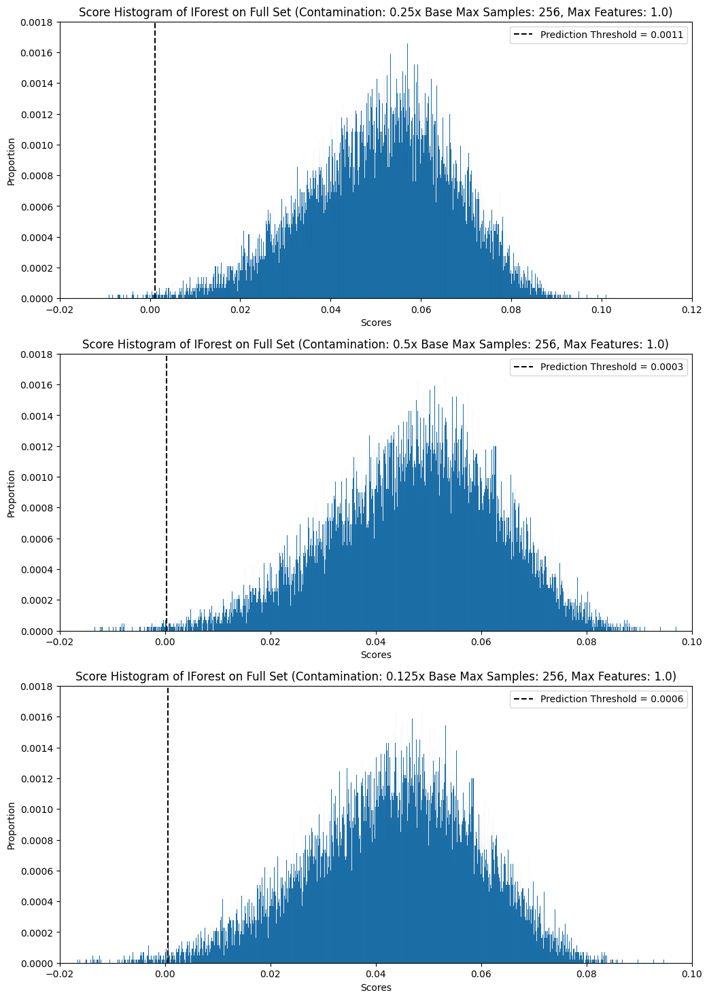

In [18]:
# Score histograms for Isolation Forests on Full Feature Set
fig, ax = plt.subplots(3, 1, figsize = (12, 18))

score_histogram(
    dataframe = iforest_full_predictions,
    score_col = 'contamination_0.0016607323930678466-max_features_1.0-max_samples_256-scores',
    contamination = 0.0016607323930678466,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.25x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[0]
);

score_histogram(
    dataframe = iforest_full_predictions,
    score_col = 'contamination_0.003321464786135693-max_features_1.0-max_samples_256-scores',
    contamination = 0.003321464786135693,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.5x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[1]
);

score_histogram(
    dataframe = iforest_full_predictions,
    score_col = 'contamination_0.006642929572271386-max_features_1.0-max_samples_256-scores',
    contamination = 0.006642929572271386,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.125x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[2]
);

### Reduced Feature Set

The Isolation Forest models on the reduced feature set exhibit similar patterns for clustering metrics as the Isolation Forest models on the full feature set. As the contamination rate grows, the Calinski-Harabasz and the Davies-Bouldin scores increase, indicating opposite results for cluster "goodness".

The candidate models whose predictions will be inspected more closely are:
- 0.0625x Base Contamination, Max Samples 512, Max Features 1.0
- 0.125x Base Contamination, Max Samples 512, Max Features 1.0
- 0.25x Base Contamination, Max Samples 256, Max Features 1.0
- 0.5x Base Contamination, Max Samples 256, Max Features 1.0,
- 1x Base Contamination, Max Samples 256, Max Features 1.0 (notably, the Default Isolation Forest parameters)

As with the full feature set, increasing max samples or decreasing max features had little positive effect.

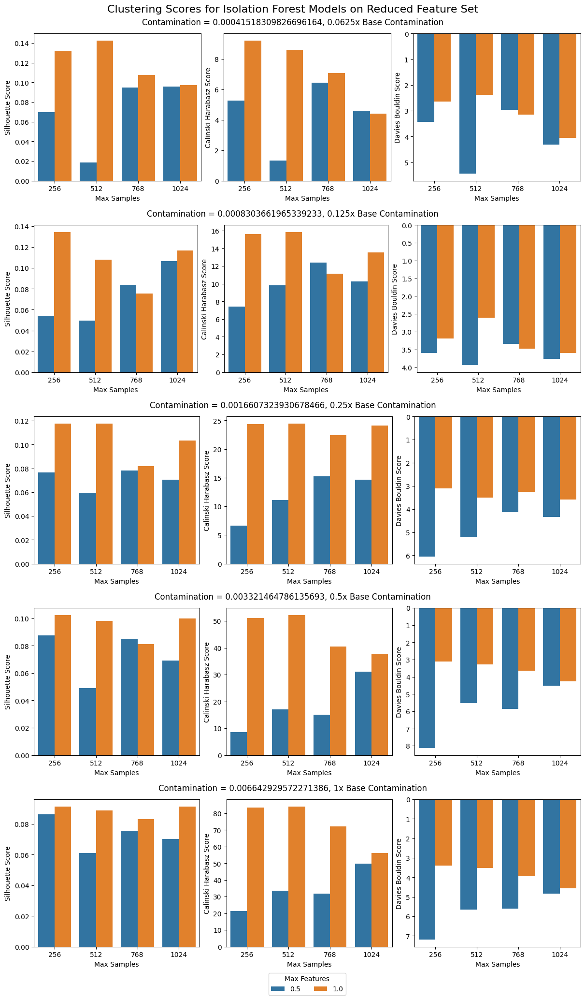

In [19]:
# Clustering Scores for Isolation Forest on Reduced Feature Set
plot_iforest_metrics(
    dataframe = iforest_reduced_metrics,
    suptitle = 'Clustering Scores for Isolation Forest Models on Reduced Feature Set'
);

In [20]:
# Candidate comparisons for Isolation Forest on reduced feature set
comparison_rows = [
    {
        'contamination_rate': 0.0625 * base_contamination, # Best model for 0.0625x base contamination
        'max_samples': 512,
        'max_features': 1 
    },
    {
        'contamination_rate': 0.125 * base_contamination, # Best model for 0.125x base contamination
        'max_samples': 512,
        'max_features': 1.0
    },
    {
        'contamination_rate': 0.25 * base_contamination, # Best model for 0.25x base contamination
        'max_samples': 256,
        'max_features': 1.0
    },
    {
        'contamination_rate': 0.5 * base_contamination, # Best model for 0.5x base contamination
        'max_samples': 256,
        'max_features': 1.0
    },
    {
        'contamination_rate': 1 * base_contamination, # Best model for 1x base contamination
        'max_samples': 256,
        'max_features': 1 
    }
]

The Isolation Forest models appear to perform slightly better on the reduced feature set than on the full feature set. The predicted anomalies are still not particularly well-clustered based on visual analysis. The removal of noisy features seems to have helped focus the Isolation Forests, but they are still not quite as focused as the GMM models.

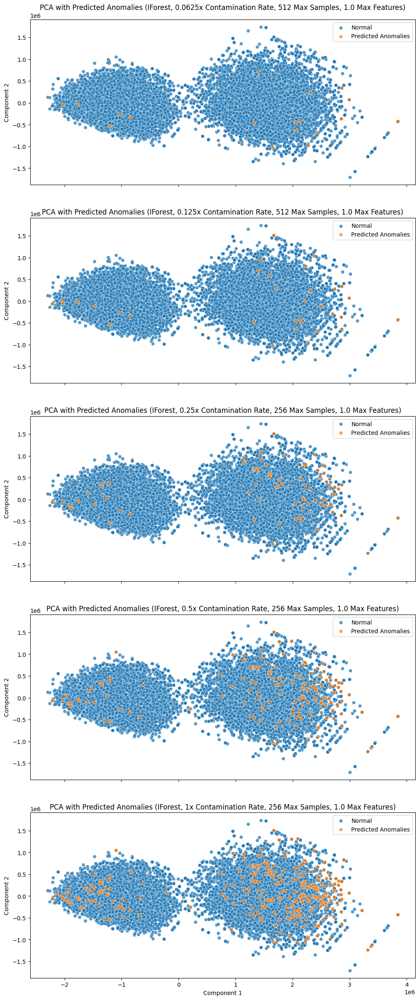

In [21]:
# Compare the predictions of the candidate Isolation Forest models on the reduced feature set
compare_iforest_pca(
    comparison_rows = comparison_rows,
    predictions_df = iforest_reduced_predictions,
    base_contamination = base_contamination,
    test_df = test_full
);

The score distributions are still not smooth, but on the reduced feature set, the distributions are left-skewed. This is a noticeable improvement, because it means that the less frequent and likely more anomalous points are more distant from the bulk of the scores. It is possible that these models would perform better by manually adjusting the threshold after training.

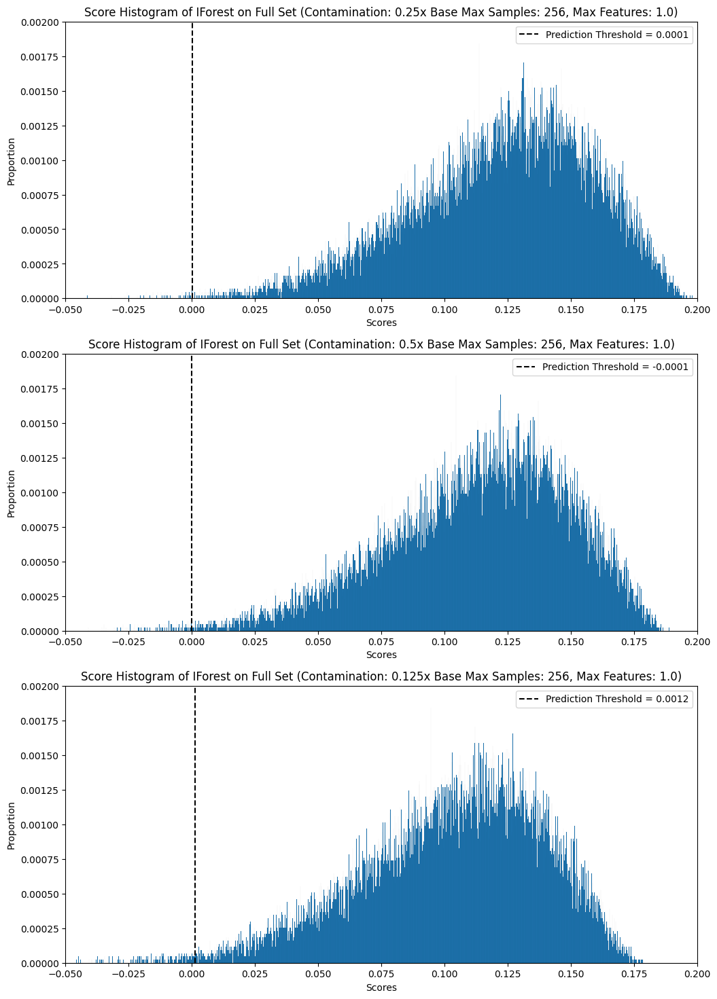

In [22]:
# Score histograms for Isolation Forests on Reduced Feature Set
fig, ax = plt.subplots(3, 1, figsize = (12, 18))

score_histogram(
    dataframe = iforest_reduced_predictions,
    score_col = 'contamination_0.0016607323930678466-max_features_1.0-max_samples_256-scores',
    contamination = 0.0016607323930678466,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.25x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[0]
);

score_histogram(
    dataframe = iforest_reduced_predictions,
    score_col = 'contamination_0.003321464786135693-max_features_1.0-max_samples_256-scores',
    contamination = 0.003321464786135693,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.5x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[1]
);

score_histogram(
    dataframe = iforest_reduced_predictions,
    score_col = 'contamination_0.006642929572271386-max_features_1.0-max_samples_256-scores',
    contamination = 0.006642929572271386,
    bins = 2500,
    title = 'Score Histogram of IForest on Full Set (Contamination: 0.125x Base '
            'Max Samples: 256, Max Features: 1.0)',
    ax = ax[2]
);

## Best Model Comparisons to EDA Suspected Anomalies

In [65]:
# Keys for looking up best models
keys = [
    'covariance_type_tied-n_components_4',
    'covariance_type_tied-n_components_20',
    'contamination_0.006642929572271386-max_features_1.0-max_samples_256',
    'contamination_0.006642929572271386-max_features_1.0-max_samples_256'
]

# Labels for best models
labels = [
    'Best GMM Full Features',
    'Best GMM Reduced Features',
    'Best IForest Full Features',
    'Best IForest Reduced Features'
]

# Prediction frames
prediction_frames = [
    gmm_full_predictions, gmm_reduced_predictions, iforest_full_predictions, iforest_reduced_predictions
]

The best performing model is likely the GMM with 4 components, tied covariance type, and trained on the full feature set. Visually, it seems to capture the most likely amonalies under PCA projection, and even captures all five of the high-value outliers that sit in the middle of the clusters. Although there are likely a number of false positives (which cannot be confirmed without labeled data), this model seems to capture as many or possibly more anomalies than the default suspected anomalies found during EDA.

The GMM models were mostly stable when using the tied covariance type. The other covariance types left a lot to be desired and often created strange groupings in comparison within this dataset. This is probably due to the fact that the data is not very well-separated, so trying to create individual covariances for each component resulted in trying to artificially slice overlapping clusters. Reducing the number of features used put more emphasis on the parts of the data highlighted during EDA but seemed to produce worse results overall, although the reduced feature set GMM model with tied covariance type and 20 components also captured all five of the high-value outliers that sit in the middle of the clusters.

The IForest models struggled to capture datapoints that are visually anomalous under PCA projection. The IForest model trained on the full feature set (1x base contamination, 256 max samples, 1.0 max features) only captured one out of the five high-value outliers that sit in the middle of the clusters and struggled to get any of the outer outliers. The IForest trained on the reduced dataset did capture all five of the high-value outliers in the middle of the clusters and generally showed improved performance. Reducing the feature set for the IForest models seemed to help skew the anomaly scores, making anomalies slightly more apparent. However, for this dataset, the IForest models struggled to capture the anomalous data.

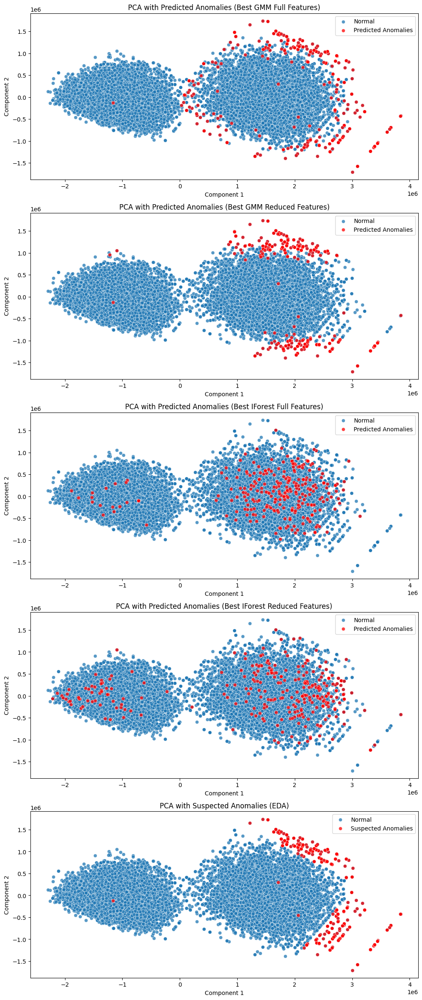

In [68]:
# Create subplots
fig, axes = plt.subplots(5, 1, figsize = (12, 30))

for key, label, prediction_frame, ax in zip(keys, labels, prediction_frames, axes):
    # Plot PCA projected anomalies for each model type
    custom_pca_plot(
        dataframe = test_full,
        masks = [prediction_frame[prediction_frame[f'{key}-predictions'] == 1].index.tolist()],
        title = f'PCA with Predicted Anomalies ({label})',
        labels = ['Predicted Anomalies'],
        colors = ['red'],
        ax = ax
    )

# Add the PCA projected suspected anomalies from EDA
custom_pca_plot(
    dataframe = test_full,
    masks = [test_full[test_full['suspected_anomaly'] == 1].index.tolist()],
    title = f'PCA with Suspected Anomalies (EDA)',
    labels = ['Suspected Anomalies'],
    colors = ['red'],
    ax = axes[-1]
);

# Save figure
fig.savefig('../visualizations/predicted_and_suspected_anomalies.png', dpi = 300, bbox_inches = 'tight')

For the GMM models, using the reduced feature set lowered the log-likelihood of each data point and also reduced the covariances found in the data. This compression of the covariances may have muddled potential anomalies compared to using the full feature set, where the longer tails may contain better information about potential anomalies.

For the IForest models, the reduced feature set introduces a noticeable skew to the score distributions, making anomalies more pronounced. In the full feature set, the scores are practically normally distributed, which likely means that the anomalous points are not sufficiently distinct enough for the IForest to capture.

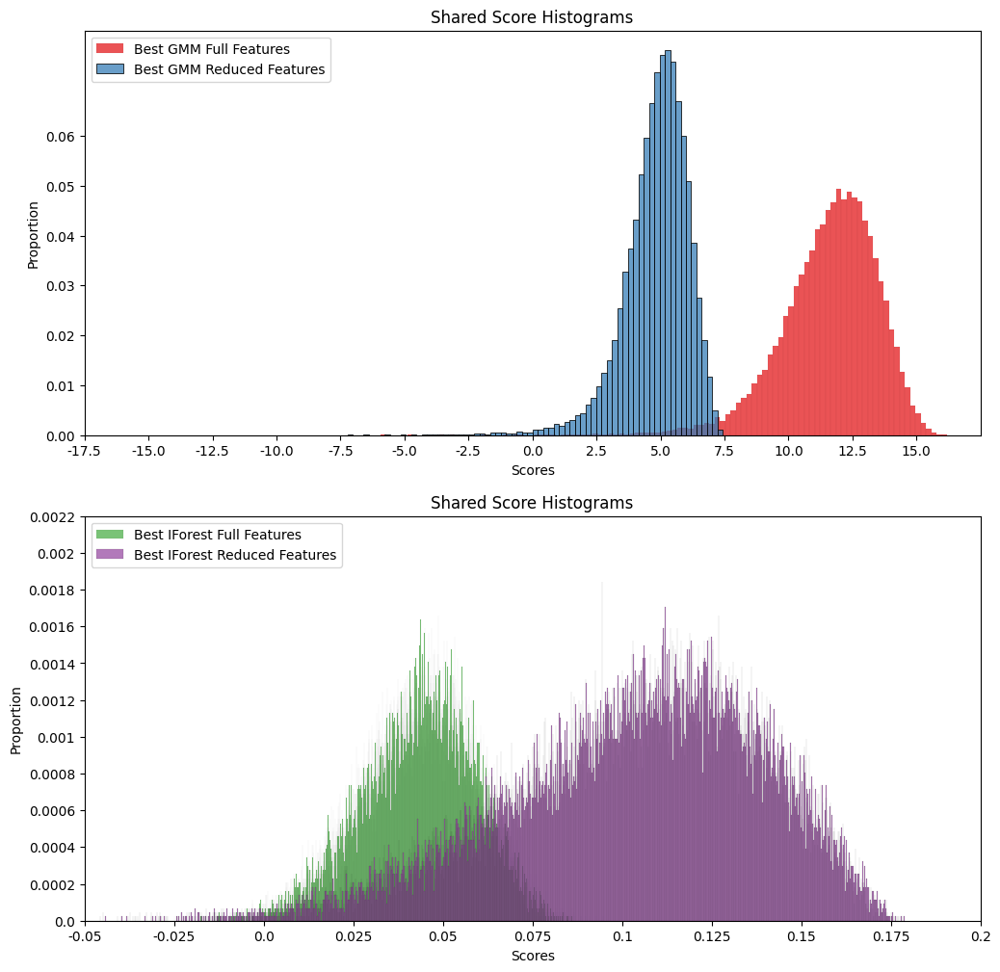

In [67]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize = (12, 12))

# Select colors
colors = sns.color_palette('Set1', n_colors = 4)

for i, (key, label, prediction_frame, color) in enumerate(zip(keys, labels, prediction_frames, colors)):
    # Plot histograms, overlay GMMs on one plot and IForests on another due to large differences in proportions
    score_histogram(
        dataframe = prediction_frame,
        score_col = f'{key}-scores',
        contamination = 0,
        hist_color = color,
        hist_label = label,
        show_threshold = False,
        alpha = 0.75,
        legend_kwargs = {'loc': 'upper left'},
        ax = axes[i // 2]
    )
    axes[i // 2].set_title('Shared Score Histograms');

# Update axis limits and ticks
axes[0].set_xlim([-17.5, 17.5]);
axes[0].set_xticks(np.arange(-17.5, 17.5, 2.5));
axes[0].set_xticklabels(np.arange(-17.5, 17.5, 2.5));
axes[1].set_xlim([-0.05, 0.15]);
axes[1].set_xticks(np.round(np.arange(-0.05, 0.21, 0.025), 3));
axes[1].set_xticklabels(np.round(np.arange(-0.05, 0.21, 0.025), 3));
axes[1].set_yticks(np.round(np.arange(0, 0.0024, 0.0002), 4));
axes[1].set_yticklabels(np.round(np.arange(0, 0.0024, 0.0002), 4));

# Save figure
fig.savefig('../visualizations/best_models_histograms.png', dpi = 300, bbox_inches = 'tight')

# Conclusion

Without labeled data, it is impossible to truly tell how many anomalies are present in the data. However, a reasonable assumption can be made about possible anomalous data points based on EDA and visual inspection of the PCA-projected data. The PCA-projected data shows two main "clusters" with some overlap, with the right "cluster" having potential outlier points floating around it and off to the side on an "island".

Notably, because these visually anomalous points were not generally well-clustered themselves, the typical metrics used to rank clustering algorithms (Silhouette score, the Calhinski-Harabasz index, and the Davies-Bouldin index) sometimes produced misleadingly poor scores. These metrics all try to measure cluster density and cluster separation, but the data showed low visual cluster separation, and the anomalous points were often separated leading to low cluster density for the anomalous points.

The Gaussian Mixture models performed the best by visual inspection of the anomalies on PCA projected data. Using the "tied" covariance type seemed to be preferable, as it produced score histograms that contained only one main grouping, making the identification of anomalies simpler by looking at the tails of the distributions. The other covariance types tended to produce distributions with multiple peaks or non-smooth distributions, which made it harder to identify potential anomalies. Despite having lower AIC and BIC scores than some of the other GMM models with different covariance types, the GMM models with the tied covariance type were the best models for this data. It is even possible that the best models would perform better with higher thresholds selected, as the threshold used was a conservative estimate based off of EDA. Using the full feature set worked best for GMMs.

The IForest model struggled to capture suspected anomalies. This is probably due to the general similarity among data points. The suspected anomalies were not very distant from the normal data points, so the IForests were unable to randomly capture these points quickly in the first few splits. Using the reduced feature set worked best for the IForests, as it helped remove unnecessary features from the data and gave slightly better separation in the data points. Unfortunately, even on the reduced dataset, the IForests struggled to capture most of the suspected anomaly points.

The biggest limitation of this data was the lack of labels. With labeled anomalies, it would be possible to use classification metrics to properly assess the effectiveness and robustness of each of these anomaly detection models. Instead, model evaluation boils down to a matter of instinct, visual intution, and a sprinkling of logic.